In [1]:
'''For computing and then plotting Average Causal Effect of the 4 features on the 3 classes'''

'For computing and then plotting Average Causal Effect of the 4 features on the 3 classes'

In [2]:
%matplotlib inline
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import pandas as pd

import os,csv,math, sys,joblib,copy,pickle
import matplotlib.pyplot as plt
import numpy as np
import sklearn.model_selection, sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score

### Defining Model

In [3]:
class neural_network(nn.Module):
    def __init__(self, num_input, num_hidden,num_output):
        super(neural_network, self).__init__()
        self.hidden = nn.Linear(num_input,num_hidden)
        self.out = nn.Linear(num_hidden,num_output)

    def forward(self, x):
        x = F.relu(self.hidden(x))
        return self.out(x)

In [4]:
#model = torch.load("/gdrive/My Drive/IRIS/Code/iris_double_model_8")
#Loading the save module
orig_model8 = torch.load("../../Models/iris_double_model_8")

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/torch/serialization.py:453: SourceChangeWarning: source code of class 'torch.nn.modules.linear.Linear' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


In [5]:
try:
    ay_model = torch.load("../../Models/ay_iris_ann_model")
except FileNotFoundError:
    ay_model = None

In [6]:
ay_model

neural_network(
  (hidden): Linear(in_features=4, out_features=8, bias=True)
  (out): Linear(in_features=8, out_features=3, bias=True)
)

In [7]:
orig_model8.state_dict(), ay_model.state_dict()

(OrderedDict([('hidden.weight', tensor([[ 0.3098,  1.1365, -1.2393, -1.2731],
                       [-0.0339, -0.1293,  0.2861,  0.6747],
                       [-0.0882, -0.0916,  0.1603,  0.3979],
                       [-0.0188, -0.0064,  0.0233,  0.0699],
                       [ 0.0842, -0.6076,  0.3487, -0.4636],
                       [ 0.0301,  0.7377, -0.4280, -0.8990],
                       [ 0.6157, -0.6194,  2.1412,  2.4142],
                       [ 0.0568, -0.0205,  1.2143,  1.9944]])),
              ('hidden.bias',
               tensor([ 1.7896, -0.4078, -0.2054, -0.0358,  0.8171,  1.0224, -0.2809, -0.6807])),
              ('out.weight',
               tensor([[ 3.9464e+00, -1.2527e-02, -7.4288e-03, -2.5171e-03, -6.3363e-01,
                         2.9357e+00, -4.0452e+00, -2.9323e+00],
                       [ 1.7060e+00, -1.9579e+00, -1.1492e+00, -5.8318e-02,  7.8110e-01,
                         1.6865e+00, -8.3465e-02, -6.4245e-01],
                       [-3.21

### Load pre-trained model

In [8]:
#Load:

ay_model = torch.load("../../Models/ay_iris_ann_model")

In [9]:
seed = 1
np.random.seed(seed)
torch.manual_seed(seed)

# Loading the dataset
#dataset = pd.read_csv('/gdrive/My Drive/IRIS/Code/Iris_Dataset.csv')
dataset = pd.read_csv('../../Data/Iris/iris.data', sep=',')

# Add column names to the dataframes
attributes = ["sepal_length", "sepal_width", "petal_length", "petal_width", "Species"]
dataset.columns = attributes

### Prepare label for prediction on original model

In [10]:
ohe_dataset = pd.get_dummies(dataset, columns=['Species']) # One Hot Encoding
values = list(ohe_dataset.columns.values)

y_ohe = ohe_dataset[values[-3:]]
y_ohe = np.array(y_ohe, dtype='float32')
X_ohe = ohe_dataset[values[:-3]]
X_ohe = np.array(X_ohe, dtype='float32')

X_ohe.shape, y_ohe.shape

((149, 4), (149, 3))

In [11]:
# Normalize X_ohe
scaler = MinMaxScaler()
X_ohe = scaler.fit_transform(X_ohe)

### Training model
Reference : https://github.com/yangzhangalmo/pytorch-iris/blob/master/main.py

In [12]:
# transform species to numerics
dataset.loc[dataset.Species=='Iris-setosa', 'Species'] = 0
dataset.loc[dataset.Species=='Iris-versicolor', 'Species'] = 1
dataset.loc[dataset.Species=='Iris-virginica', 'Species'] = 2

In [13]:
dataset.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'Species'],
      dtype='object')

In [14]:
X_train, X_test, y_train, y_test = train_test_split(dataset[dataset.columns[0:4]].values,
                                                    dataset.Species.values, test_size=0.8)

In [15]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((29, 4), (120, 4), (29,), (120,))

In [16]:
# wrap up with Variable in pytorch
X_train = autograd.Variable(torch.Tensor(X_train).float())
X_test = autograd.Variable(torch.Tensor(X_test).float())
y_train = autograd.Variable(torch.Tensor(y_train).long())
y_test = autograd.Variable(torch.Tensor(y_test).long())

In [17]:
X_values = dataset[dataset.columns[0:4]].to_numpy()
y_values = dataset[dataset.columns[4:5]].to_numpy()
X_values.shape, type(X_values), y_values.shape, type(y_values)

X_values_unnorm = np.copy(X_values)

In [18]:
# Normalize
scaler = MinMaxScaler()
X_values = scaler.fit_transform(X_values)

In [19]:
criterion = nn.CrossEntropyLoss()

In [20]:
optimizer = torch.optim.SGD(ay_model.parameters(), lr=0.01)

In [21]:
if ay_model is None:
    for epoch in range(1000):
        optimizer.zero_grad()
        out = model(X_train)
        loss = criterion(out, y_train)
        loss.backward()
        optimizer.step()
    
        if epoch % 100 == 0:
            print("number of epoch : ", epoch, " loss : ", loss.item() )
        
    #end-for
else:
    print("model is already trained")

model is already trained


In [22]:
out_predict = ay_model(X_test)
_, y_predict = torch.max(out_predict, 1)

print("Prediction accuracy : ", accuracy_score(y_test.data, y_predict.data))
print("macro precision : ", precision_score(y_test.data, y_predict.data, average='macro'))
print("micro precision : ", precision_score(y_test.data, y_predict.data, average='micro'))
print("macro recall : ", recall_score(y_test.data, y_predict.data, average='macro'))
print("micro recall : ", recall_score(y_test.data, y_predict.data, average='micro'))

Prediction accuracy :  0.9666666666666667
macro precision :  0.9664781060129898
micro precision :  0.9666666666666667
macro recall :  0.9664781060129898
micro recall :  0.9666666666666667


In [23]:
def getModelPrediction(npX, model=ay_model):
    X_torch = autograd.Variable(torch.Tensor(npX).float())
    predict_res = model(X_torch)
    _, y_pred = torch.max(predict_res, 1)
    return y_pred

### Original model's accuracy

In [24]:
def getOrigModelPrediction(npX, verbose=False):
    inp_X = autograd.Variable(torch.FloatTensor(npX), requires_grad=True)
    orig_predict = orig_model8(inp_X)
    _, y_orig_predict = torch.max(orig_predict, 1)
    # (autograd.Variable(torch.FloatTensor(y_ohe).data), orig_predict.data)
    if( verbose == True ):
        print( type(y_orig_predict) )
        print( y_orig_predict )
    return y_orig_predict

In [25]:
inp_X = autograd.Variable(torch.FloatTensor(X_ohe), requires_grad=True)
orig_predict = orig_model8(inp_X)
_, y_orig_predict = torch.max(orig_predict, 1)
# (autograd.Variable(torch.FloatTensor(y_ohe).data), orig_predict.data)
print( type(y_orig_predict) )
print( y_orig_predict )

<class 'torch.Tensor'>
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2])


In [26]:
y_orig_np = pd.get_dummies(pd.DataFrame(y_ohe)).idxmax(1).to_numpy()
y_orig_np

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [28]:
accuracy_score(y_orig_np, y_orig_predict.data.numpy())

0.9865771812080537

### Save Model

In [29]:
#Save:

torch.save(ay_model, "../../Models/ay_iris_ann_model")

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type neural_network. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [30]:
color=["blue", "green", "red", "black"]

#Calculating covariance and mean of data
cov = np.cov(X_values, rowvar=False)
means = np.mean(X_values, axis=0)
print('cov : ', cov)
print('means : ', means)
print(type(cov), type(means))

#+AY : redundant code as cov is a matrix and means is a vector 
cov=np.array(cov)
mean_vector = np.array(means)
print('cov array : ', cov)
print('mean_vector : ', mean_vector)
print(type(cov), type(mean_vector))
#-AY

n_classes=3
num_c=4#no. of features
num_alpha=1000

cov :  [[ 0.05297593 -0.00431466  0.0598099   0.05964663]
 [-0.00431466  0.03262522 -0.022368   -0.02009526]
 [ 0.0598099  -0.022368    0.08895065  0.09103985]
 [ 0.05964663 -0.02009526  0.09103985  0.10061902]]
means :  [0.43008949 0.43791946 0.47025367 0.46057047]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
cov array :  [[ 0.05297593 -0.00431466  0.0598099   0.05964663]
 [-0.00431466  0.03262522 -0.022368   -0.02009526]
 [ 0.0598099  -0.022368    0.08895065  0.09103985]
 [ 0.05964663 -0.02009526  0.09103985  0.10061902]]
mean_vector :  [0.43008949 0.43791946 0.47025367 0.46057047]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


### SNR

In [31]:
from sklearn.metrics import mean_squared_error

def snr(signal, noise, verbose=False):
    dim = signal.shape[1]
    snrPerColumn = []
    
    signalRMS = np.zeros(shape=dim)
    noiseRMS = np.zeros(shape=dim)
    
    for col in range(0, dim):
        signalRMS[col] = np.sqrt(mean_squared_error(signal[:,col],\
                                                   np.zeros(shape=signal.shape[0])))
        
        noiseRMS[col] = np.sqrt(mean_squared_error(noise[:,col],\
                                                  np.zeros(shape=noise.shape[0])))
        snrPerColumn.append( ( signalRMS[col] ** 2 ) / ( noiseRMS[col] ** 2 ) )
    
    if(verbose):
        print("SNR  : ", snrPerColumn)
    
    return snrPerColumn

### KL Divergence
###### computes distance between the PDFs

In [32]:
def kl_divergence(p, q, verbose=False):
    dim = p.shape[1]
    kl_div_sum = np.zeros(shape=dim)
    
    for col in range(0, dim):
        for i in range(0, p.shape[0]):
            if( p[i,col] != 0 and q[i,col] != 0):
                kl_div_sum[col] += p[i,col] * np.log2( p[i,col] / q[i,col])
    
    if(verbose):
        print("KL divergence : ", kl_div_sum)
        
    return kl_div_sum

In [33]:
def normToPDF(npX, verbose=False):
    normPDF = np.zeros(shape=npX.shape)
    try:
        dim = npX.shape[1]
    except IndexError:
        normPDF = np.reshape(normPDF, newshape=(npX.shape[0], 1))
        dim = normPDF.shape[1]
    
    for col in range(0, dim):
        normPDF[:,col] = ( npX[:,col] - npX[:,col].min() ) / ( npX[:,col].max() - npX[:,col].min() )
        normPDF[:,col] /= normPDF[:,col].sum()
        
        if(verbose):
            if( np.sum( normPDF[:,col] ) == 1.0 ):
                print("Successfully converted to pdf")
            else:
                print("[Problem] pdf sum is %f" % ( np.sum( normPDF[:,0] ) ) )
    
    return normPDF

### ACE Computation
###### computes average causal expectation for feature set

In [34]:
def getACE(meanVector, covMatrix, n_classes, num_c, num_alpha, feature, noise_mean, noise_std_dev,\
          dataCategory, plotEnabled=False, model=None):
#     print("ACE computation started")
    feature_name = {0:"SepalLength",1:"SepalWidth",2:"PetalLength",3:"PetalWidth",4:"Species"}
    col={0:"b",1:"g",2:"r",3:"c"}
    tit={0:"Iris-setosa",1:"Iris-versicolor",2:"Iris-virginica"}
    ace_list = []
    for _class in range(0,n_classes):#For every class
#         print("ACE for class %d" % (_class))
        plt.figure()
        for t in range(0,num_c):#For every feature
            expectation_do_x = []
            inp=copy.deepcopy(meanVector)
        
            for x in np.linspace(0, 1, num_alpha):
           
                inp[t] = x
                input_torchvar = autograd.Variable(torch.FloatTensor(inp), requires_grad=True)
            
                output=F.softmax(model(input_torchvar), dim=-1) 
            
                o1=output.data.cpu()
                val=o1.numpy()[_class]#first term in interventional expectation                                       
            
                grad_mask_gradient = torch.zeros(n_classes)
                grad_mask_gradient[_class] = 1.0
                #calculating the hessian
                first_grads = torch.autograd.grad(output.cpu(), input_torchvar.cpu(), \
                                                  grad_outputs=grad_mask_gradient, \
                                                  retain_graph=True, create_graph=True)

                for dimension in range(0,num_c):#Tr(Hessian*Covariance)
                    if dimension == t: #+AY : only compute for other features than intervened above
                      continue
                    temp_cov = copy.deepcopy(covMatrix)
                    temp_cov[dimension][t] = 0.0#row,col in covariance corresponding to the intervened one made 0
                    grad_mask_hessian = torch.zeros(num_c)
                    grad_mask_hessian[dimension] = 1.0

                    #calculating the hessian
                    hessian = torch.autograd.grad(first_grads, input_torchvar, \
                                                  grad_outputs=grad_mask_hessian, \
                                                  retain_graph=True, create_graph=False)

                    #adding second term in interventional expectation
                    val += np.sum(0.5*hessian[0].data.numpy()*temp_cov[dimension])
                expectation_do_x.append(val)#append interventional expectation for given interventional value
            #end-for-loop-over-alphas
            
            #+AY
            #print("class : ", _class, " t : ", t, " output : ", o1)
            #-AY  
            
#             print(_class, t, np.min( expectation_do_x ), np.max( expectation_do_x ), len( expectation_do_x ))
            
            #+AY
            ace_list.append( np.array(expectation_do_x) - np.mean(np.array(expectation_do_x)) )
            #-AY
            
            if( plotEnabled == True ):
                plt.title(tit[_class] + "_" + "feature-" + str(feature) + "_"+\
                          str(noise_mean) + "_" + str(noise_std_dev))
                plt.xlabel('Intervention Value(alpha)')
                plt.ylabel('Causal Attributions(ACE)')
            
                #Baseline is np.mean(expectation_do_x)
                plt.plot(np.linspace(0, 1, num_alpha), \
                             np.array(expectation_do_x) - np.mean(np.array(expectation_do_x)),\
                             label = feature_name[t],color=col[t])
                plt.legend()

                #Plotting vertical lines to indicate regions
                if _class == 0:
                    plt.plot(np.array([0.2916666567325592]*1000),np.linspace(-3,3,1000),"--")
                if _class == 1:	
                    plt.plot(np.array([0.2916666567325592]*1000),np.linspace(-3,3,1000),"--")
                    plt.plot(np.array([0.6874999403953552]*1000),np.linspace(-3,3,1000),"--")
                if _class == 2:	
                    plt.plot(np.array([0.6874999403953552]*1000),np.linspace(-3,3,1000),"--")
            
                plt.savefig("../../Data/Iris/"+\
                            str(_class)+\
                            "_"+\
                            dataCategory +\
                            "_gauss-noise-at-"+\
                            str(feature)+\
                            "th-feature"+\
                            str(noise_mean)+\
                            "-"+\
                            str(noise_std_dev)+\
                            ".png")
        #end-for-loop-over-feature
    #end-for-loop-over-class
    
    return ace_list

### Weights vs ACE values

hidden.weight tensor([[ 0.3098,  1.1365, -1.2393, -1.2731],
        [-0.0339, -0.1293,  0.2861,  0.6747],
        [-0.0882, -0.0916,  0.1603,  0.3979],
        [-0.0188, -0.0064,  0.0233,  0.0699],
        [ 0.0842, -0.6076,  0.3487, -0.4636],
        [ 0.0301,  0.7377, -0.4280, -0.8990],
        [ 0.6157, -0.6194,  2.1412,  2.4142],
        [ 0.0568, -0.0205,  1.2143,  1.9944]])
hidden.bias tensor([ 1.7896, -0.4078, -0.2054, -0.0358,  0.8171,  1.0224, -0.2809, -0.6807])
out.weight tensor([[ 3.9464e+00, -1.2527e-02, -7.4288e-03, -2.5171e-03, -6.3363e-01,
          2.9357e+00, -4.0452e+00, -2.9323e+00],
        [ 1.7060e+00, -1.9579e+00, -1.1492e+00, -5.8318e-02,  7.8110e-01,
          1.6865e+00, -8.3465e-02, -6.4245e-01],
        [-3.2135e+00,  1.9687e+00,  1.1524e+00,  5.9452e-02, -7.2356e-01,
         -2.2781e+00,  1.0003e+00,  1.6006e+00]])
out.bias tensor([ 1.0600,  0.3809, -0.9272])


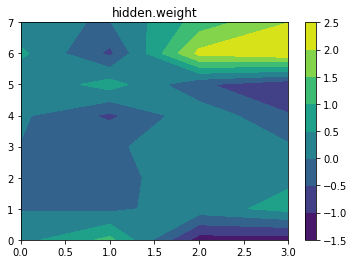

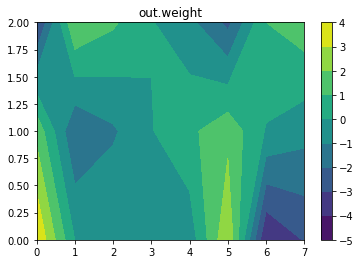

In [62]:
orig_model8_dict = orig_model8.state_dict()

for i, key in zip(range(len(orig_model8_dict.keys())), orig_model8_dict.keys()):
    print(key, orig_model8_dict.get(key))
    
    if( 'weight' in key ):
        plt.figure(i)
        plt.contourf(orig_model8_dict.get(key))
        plt.title(key)
        plt.colorbar()

### Perturb features under same label
    1. Add noise from a distribution different from feature's distribution
    2. Tabluate KL divergence w.r.t original distribution
    3. Compare the labels after perturbation

In [35]:
def getGaussNoise(seed, loc, scale, size):
    np.random.seed(seed)
    return np.random.normal(loc, scale, size)

In [36]:
def getLaplaceNoise(seed, loc, scale,size):
    np.random.seed(seed)
    return np.random.laplace(loc, scale, size)

###### No feature comes from Normal distribution
None of the features found to be following normal distribution based on results of 
Anderson-Darling test on normality.
Hence, adding gaussian noise on all the features

In [37]:
X_gauss_noise = getGaussNoise(seed=10, loc=5, scale=10, size=X_values.shape[0])

### Classification Accuracy vs Noise Variance

In [39]:
acc = []
for mu in range(0, 10, 5):
    for sigma in range(0, 10, 1):
        for f in range(0, X_values.shape[1]):
            noise = getGaussNoise(seed = 10, loc=mu, scale=sigma, size=X_values.shape[0])
            X_noise_test = np.copy(X_values)
            X_noise_test[:,f] = np.copy( X_noise_test[:,f] + noise )
            
            X_noise_test = scaler.fit_transform(X_noise_test)
            
            y_noise_pred = getOrigModelPrediction(X_noise_test, verbose=False)
        
            acc.append( accuracy_score(y_orig_np, y_noise_pred.data.numpy()) )

0
5


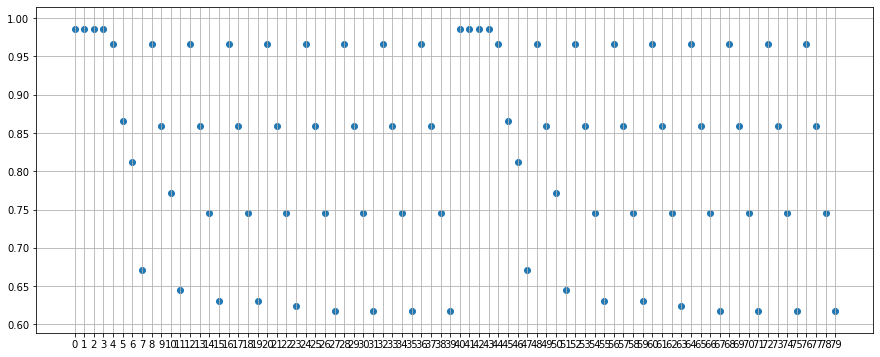

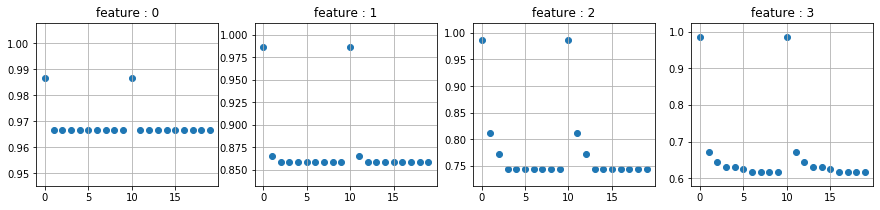

In [45]:
for i in range(0, 10, 5):
    print(i)
    
plt.figure(figsize=(15,6))
plt.scatter(list(range(len(acc))), acc)
plt.xticks(list(range(len(acc))))
plt.grid(True)

'''
TODO : plot accuracy feature-wise if grids are not clearer to follow
'''

fig, ax = plt.subplots(1, 4, figsize=(15,3))
for i in range(0, X_values.shape[1]):
    d = {0 : [acc[i] for i in range(0,len(acc)) if i%4 == 0],\
        1 : [acc[i] for i in range(0,len(acc)) if i%4 == 1],\
        2 : [acc[i] for i in range(0,len(acc)) if i%4 == 2],\
        3 : [acc[i] for i in range(0,len(acc)) if i%4 == 3]
        }
    feature_acc = d.get(i)
    ax[i].scatter(list(range(len(feature_acc))), feature_acc)
    ax[i].grid(True)
    ax[i].set_title("feature : " + str(i))

### Un-normalized features are used to compute ACE
    Apparently, change in pattern of ACE values for all the features of every class

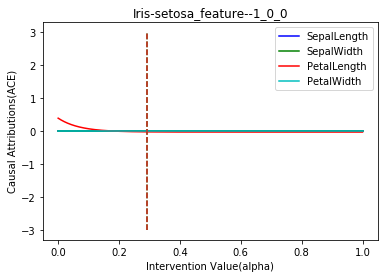

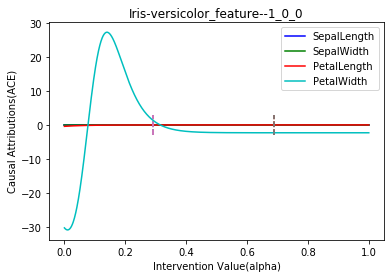

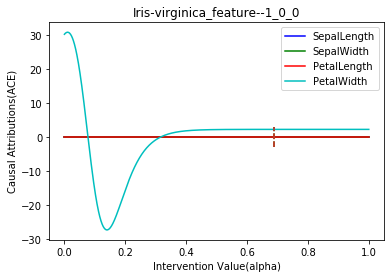

In [46]:
# ace with original data
ace_values = getACE(meanVector=np.mean(X_values_unnorm, axis=0),\
                    covMatrix=np.cov(X_values_unnorm, rowvar=False),\
                    n_classes=3, num_c=4, num_alpha=1000, feature=-1,\
                    noise_mean=0, noise_std_dev=0, dataCategory="orig",\
                    plotEnabled=True, model=orig_model8)

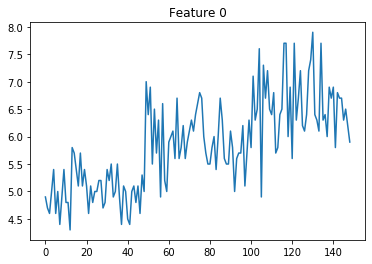

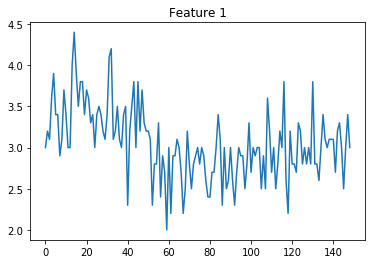

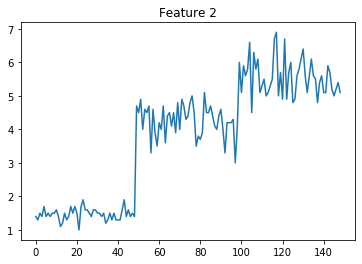

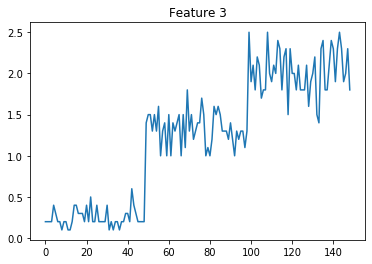

In [47]:
for t in range(0, num_c):
    plt.figure(t+1)
    plt.plot(X_values_unnorm[:,t])
    plt.title("Feature " + str(t))

In [52]:
# Mean of ACE values of all un-normalized features
for i in range(0, len(ace_values_with_norm)):
    print("Mean of ACE : %f" % (np.mean(ace_values[i])))

Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : 0.000000
Mean of ACE : 0.000000
Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : 0.000000


### Normalized features are used to compute ACE

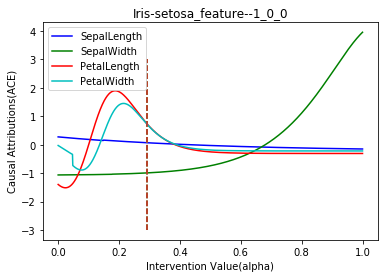

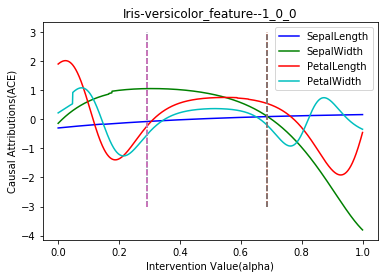

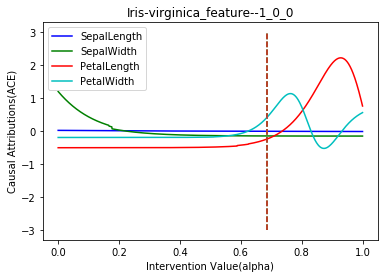

In [48]:
# ace with original data
ace_values_with_norm = getACE(meanVector=np.mean(X_values, axis=0), covMatrix=np.cov(X_values, rowvar=False),\
                                n_classes=3, num_c=4, num_alpha=1000, feature=-1,\
                                noise_mean=0, noise_std_dev=0, dataCategory="orig",\
                                plotEnabled=True, model=orig_model8)

In [51]:
# Mean of ACE values of all features
for i in range(0, len(ace_values_with_norm)):
    print("Mean of ACE : %f" % (np.mean(ace_values_with_norm[i])))

Mean of ACE : 0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : 0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : -0.000000
Mean of ACE : 0.000000
Mean of ACE : 0.000000


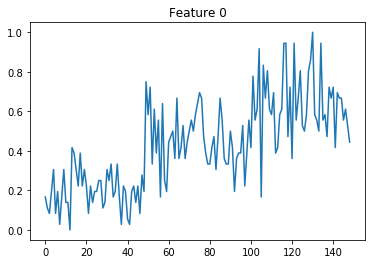

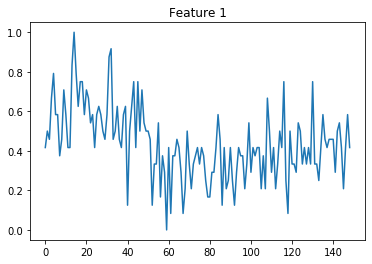

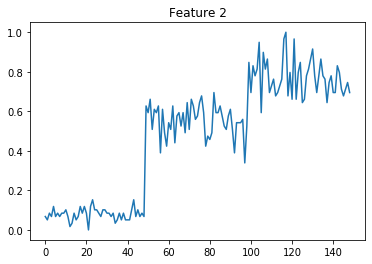

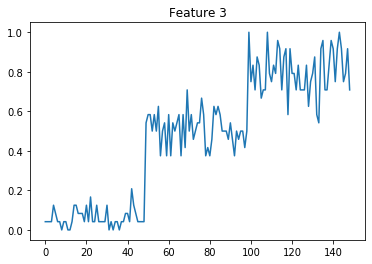

In [50]:
for t in range(0, num_c):
    plt.figure(t+1)
    plt.plot(X_values[:,t])
    plt.title("Feature " + str(t))

In [66]:
def computeStats(npX, noiseVector, noiseMean, noiseStdDev,normAfterNoise=False,\
                 model=None, acePlotEnabled=False, verbose=False):

    X_with_noise = np.copy(npX) # Note - copying normalized features

    print("Noise ~ N( %f, %f )" % ( noiseMean, noiseStdDev ))
    print("\nKL divergence after perturbation")

    # compute outside this function
    #y_values_pred = getModelPrediction(npX) # Model output on original data
    y_noise_pred = []

    ace_with_noise = [] # ace with noise data
    snr_list = []
    kl_div = []
    for t in range(0, npX.shape[1]+1):    # iterate +1 more to add noise to all feature simultaenously
        if( t == npX.shape[1] ): # add noise to all feature simultaenously
            temp = noiseVector
            temp = np.reshape(temp, newshape=(temp.shape[0],1))
            X_with_noise = np.copy( npX + temp )
        else: # add noise individually
            X_with_noise = np.copy(npX)
            X_with_noise[:,t] = np.copy(noiseVector)
        
        '''
        TODO : check w/o normalization of X_with_noise
        '''
        if(normAfterNoise == True):
            X_with_noise = scaler.fit_transform(X_with_noise)
    
        p = normToPDF(npX, verbose=False)
        q = normToPDF(X_with_noise, verbose=False)
    
        # SNR()
        snr_val = snr( X_with_noise, npX )
        snr_list.append( snr_val )
    
        # ACE
        ace_with_noise.append( getACE(meanVector=np.mean(X_with_noise, axis=0),\
                                      covMatrix=np.cov(X_with_noise, rowvar=False),\
                                      n_classes=3, num_c=4,num_alpha=1000, feature=t,\
                                      noise_mean=noiseMean, noise_std_dev=noiseStdDev,\
                                      dataCategory="orig+perturb",\
                                      plotEnabled=acePlotEnabled, model=model) )
    
        # KL(q || p)
        dist = kl_divergence(q, p, False )
        kl_div.append( dist )
    
        '''
        TODO : check class label with perturbed features
        '''
        y_noise_pred.append( getModelPrediction( X_with_noise, model ) )
    
        if(verbose == True):
            if( t == X_values.shape[1]):
                print("Feature All : ", dist )
            else:
                print("Feature %d : %f" % ( t, dist[t] ) )
            
    return y_noise_pred, ace_with_noise, snr_list, kl_div

In [68]:
X_gauss_noise_5_10 = getGaussNoise(seed=10, loc=5, scale=10, size=X_values.shape[0])

Noise ~ N( 5.000000, 10.000000 )

KL divergence after perturbation
Feature 0 : 0.422576
Feature 1 : 0.297869
Feature 2 : 0.735871
Feature 3 : 0.756307
Feature All :  [0.416958   0.29319885 0.71852237 0.73829161]


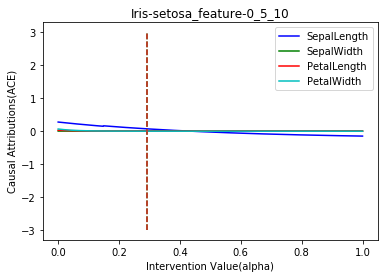

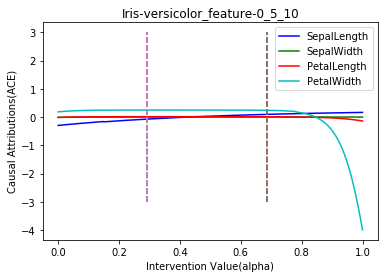

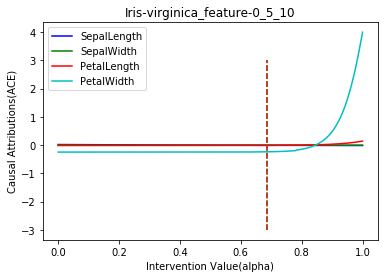

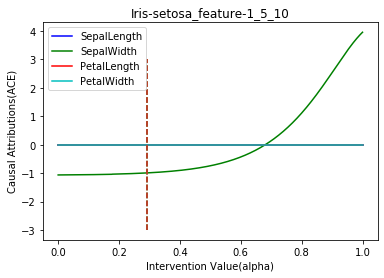

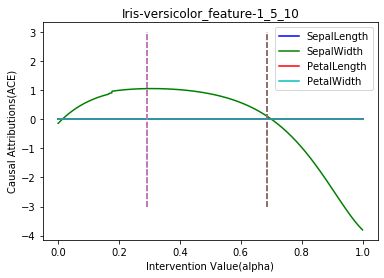

...

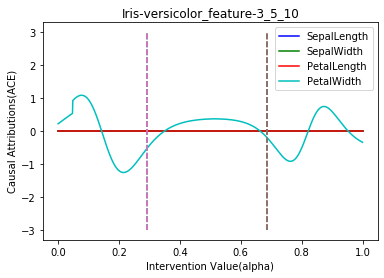

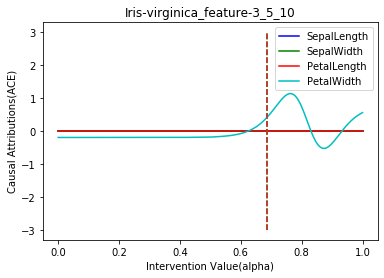

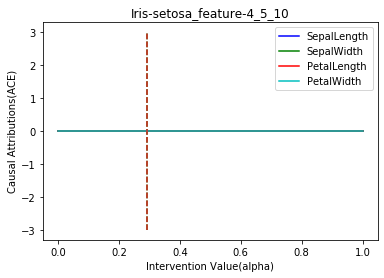

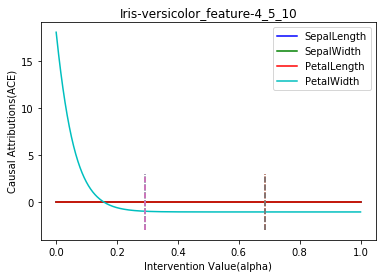

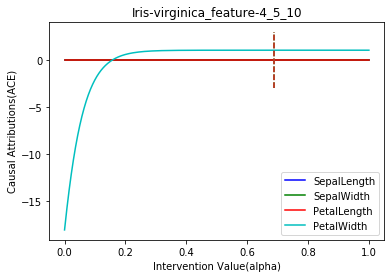

In [67]:
y_noise_pred_unnorm, ace_with_noise_unnorm,\
snr_list_unnorm, kl_div_unnorm = computeStats(npX=X_values, noiseVector=X_gauss_noise_5_10,\
                                              noiseMean=5, noiseStdDev=10,\
                                              normAfterNoise=False, model=orig_model8,\
                                              acePlotEnabled=True, verbose=True)

Noise ~ N( 5.000000, 10.000000 )

KL divergence after perturbation
Feature 0 : 0.422576
Feature 1 : 0.297869
Feature 2 : 0.735871
Feature 3 : 0.756307
Feature All :  [0.416958   0.29319885 0.71852237 0.73829161]


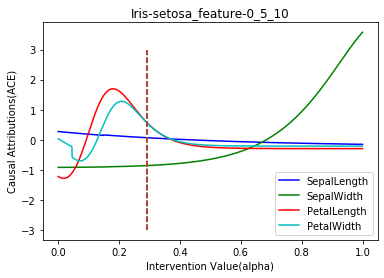

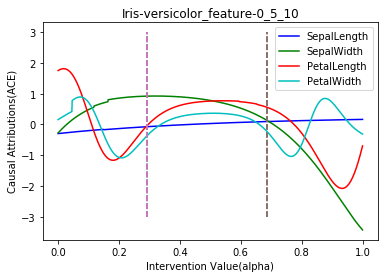

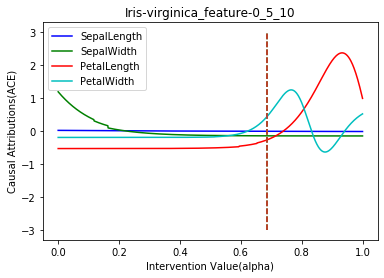

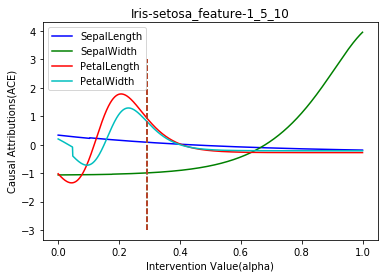

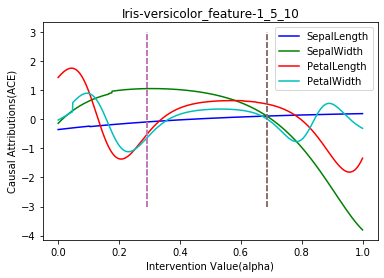

...

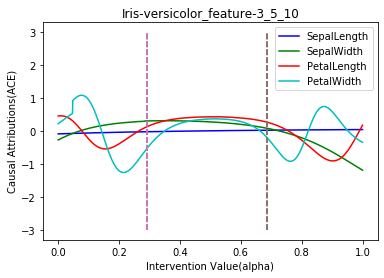

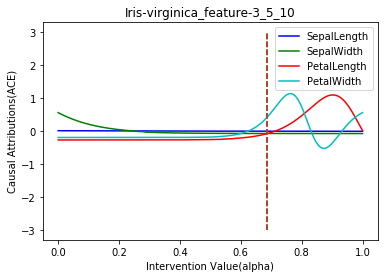

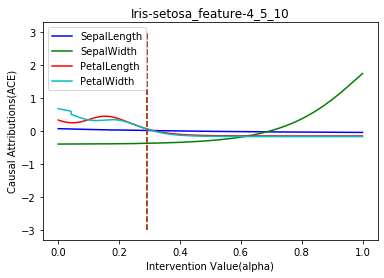

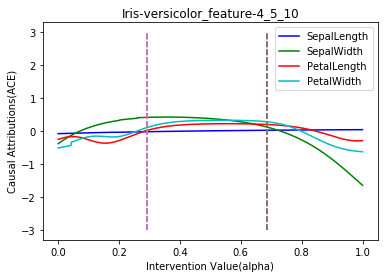

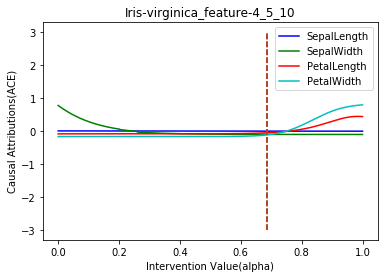

In [70]:
y_noise_pred_norm, ace_with_noise_norm,\
snr_list_norm, kl_div_norm = computeStats(npX=X_values, noiseVector=X_gauss_noise_5_10,\
                                          noiseMean=5, noiseStdDev=10,\
                                          normAfterNoise=True, model=orig_model8,\
                                          acePlotEnabled=True, verbose=True)

Noise ~ N( 10.000000, 15.000000 )

KL divergence after perturbation
Feature 0 : 0.422576
Feature 1 : 0.297869
Feature 2 : 0.735871
Feature 3 : 0.756307
Feature All :  [0.41880525 0.29474092 0.7242854  0.74426761]


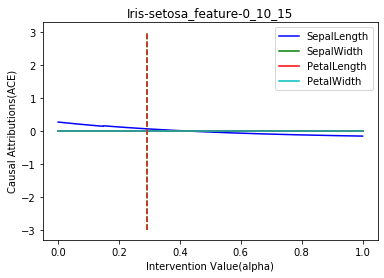

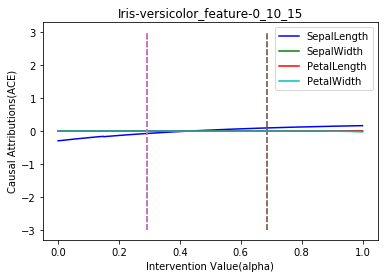

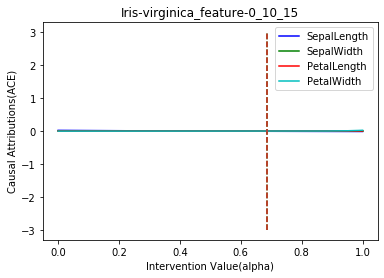

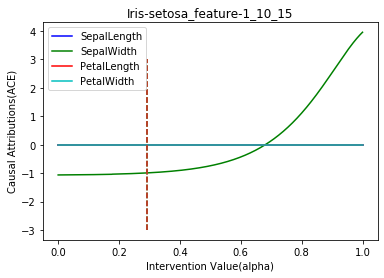

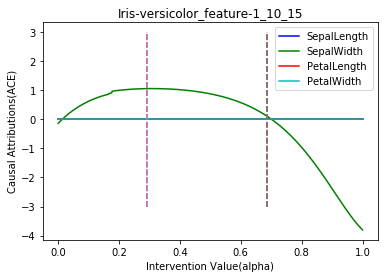

...

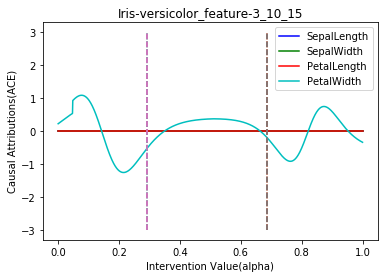

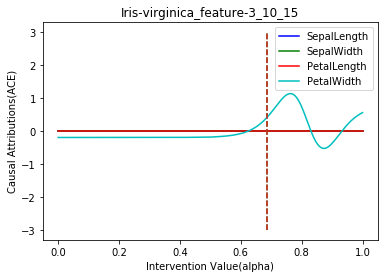

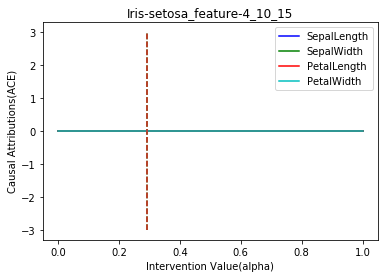

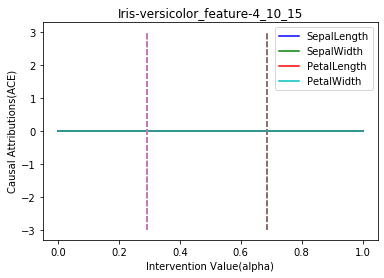

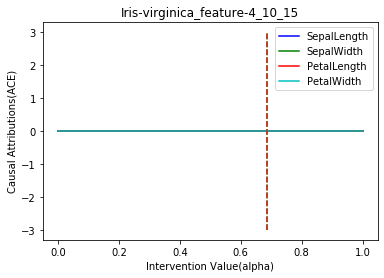

In [71]:
X_gauss_noise_10_15 = getGaussNoise(seed=10, loc=10, scale=15, size=X_values.shape[0])
y_noise_pred_unnorm_10_15, ace_with_noise_unnorm_10_15,\
snr_list_unnorm_10_15, kl_div_unnorm_10_15 = computeStats(npX=X_values, noiseVector=X_gauss_noise_10_15,\
                                                          noiseMean=10, noiseStdDev=15,\
                                                          normAfterNoise=False, model=orig_model8,\
                                                          acePlotEnabled=True, verbose=True)

Noise ~ N( 10.000000, 15.000000 )

KL divergence after perturbation
Feature 0 : 0.422576
Feature 1 : 0.297869
Feature 2 : 0.735871
Feature 3 : 0.756307
Feature All :  [0.41880525 0.29474092 0.7242854  0.74426761]


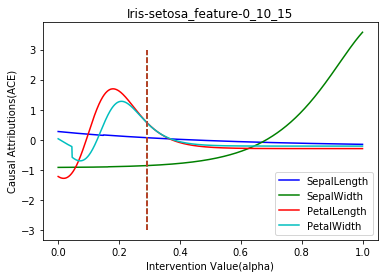

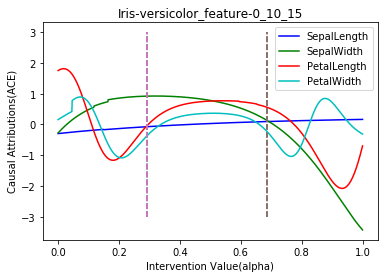

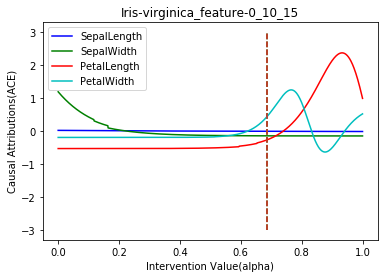

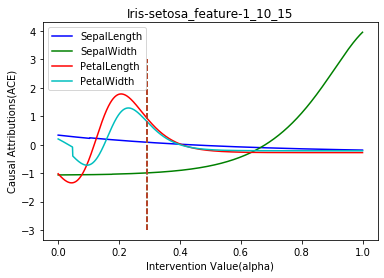

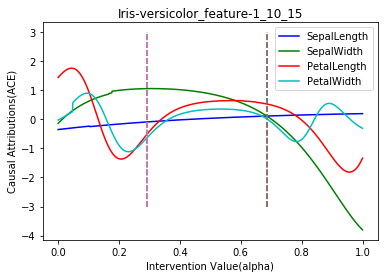

...

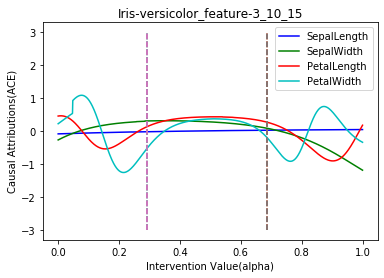

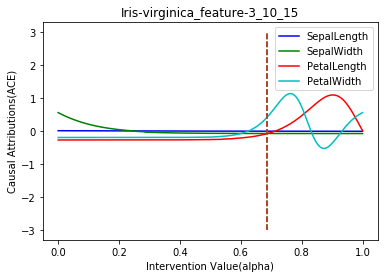

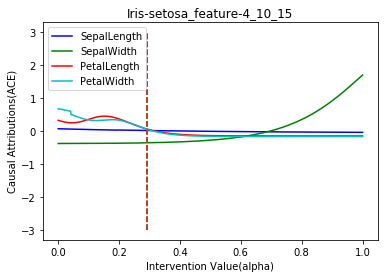

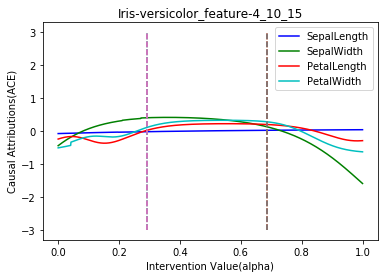

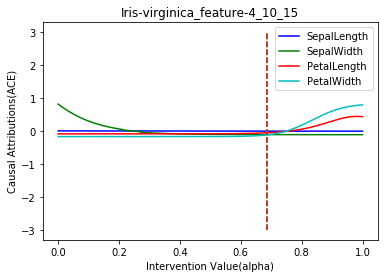

In [72]:
y_noise_pred_norm_10_15, ace_with_noise_norm_10_15,\
snr_list_norm_10_15, kl_div_norm_10_15 = computeStats(npX=X_values, noiseVector=X_gauss_noise_10_15,\
                                                          noiseMean=10, noiseStdDev=15,\
                                                          normAfterNoise=True, model=orig_model8,\
                                                          acePlotEnabled=True, verbose=True)

### Verifying MinMaxScaler Normalization

-15.650454418149375 30.37095500879047 5.76531933165392
-15.858787751482707 30.19491748728143 5.709763776098365
-15.690002440748245 30.449860990106288 5.937164906041867
-15.733787751482707 30.486584153948094 6.001430442765031


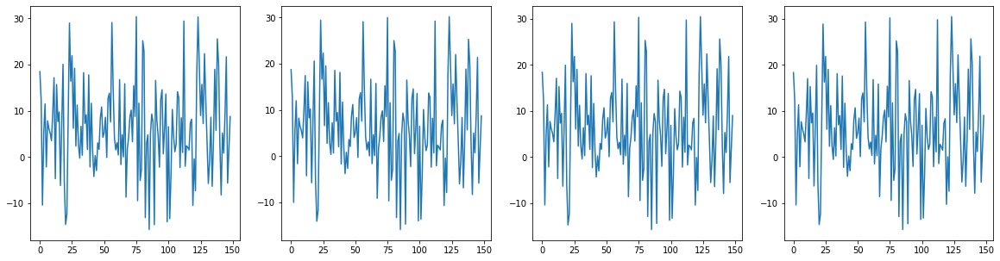

In [52]:
x_dummy = np.copy(X_with_noise)
fig,ax = plt.subplots(1, x_dummy.shape[1], figsize=(20,5))

for t in range(0, x_dummy.shape[1]):
    print(x_dummy[:,t].min(), x_dummy[:,t].max(), np.median(x_dummy[:,t]))
    ax[t].plot(x_dummy[:,t])
#end-for

0.0 1.0 0.4653437175539219
0.0 1.0 0.468334771670586
0.0 1.0 0.46873063200979587
0.0 1.0 0.4702519105367452


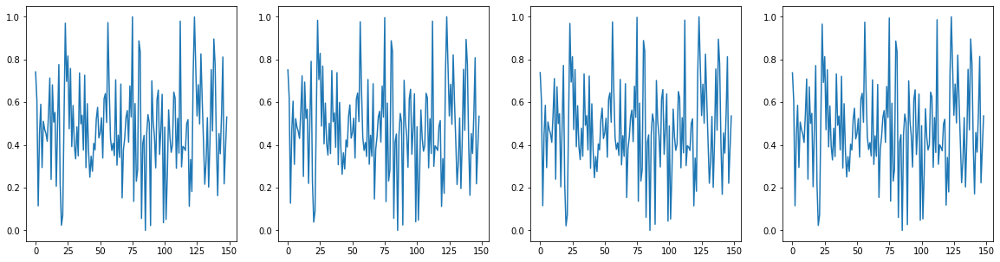

In [54]:
x_dummy_norm = scaler.fit_transform(x_dummy)

fig,ax = plt.subplots(1, x_dummy_norm.shape[1], figsize=(20,5))

for t in range(0, x_dummy_norm.shape[1]):
    print(x_dummy_norm[:,t].min(), x_dummy_norm[:,t].max(), np.median(x_dummy_norm[:,t]))
    ax[t].plot(x_dummy_norm[:,t])
#end-for

In [57]:
len(snr_list), len(snr_list[0]), len(ace_with_noise), len(ace_with_noise[0]),\
len(ace_with_noise[0][0]), np.size(ace_with_noise), len(ace_values), len(ace_values[0])

(5, 4, 5, 12, 1000, 60000, 12, 1000)

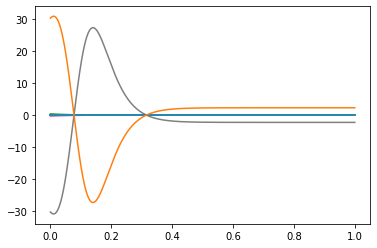

In [58]:
plt.plot(np.linspace(0, 1, 1000), ace_values[0])
plt.plot(np.linspace(0, 1, 1000), ace_values[1])
plt.plot(np.linspace(0, 1, 1000), ace_values[2])
plt.plot(np.linspace(0, 1, 1000), ace_values[3])
plt.plot(np.linspace(0, 1, 1000), ace_values[4])
plt.plot(np.linspace(0, 1, 1000), ace_values[5])
plt.plot(np.linspace(0, 1, 1000), ace_values[6])
plt.plot(np.linspace(0, 1, 1000), ace_values[7])
plt.plot(np.linspace(0, 1, 1000), ace_values[8])
plt.plot(np.linspace(0, 1, 1000), ace_values[9])
plt.plot(np.linspace(0, 1, 1000), ace_values[10])
plt.plot(np.linspace(0, 1, 1000), ace_values[11])

12 1000 5 4


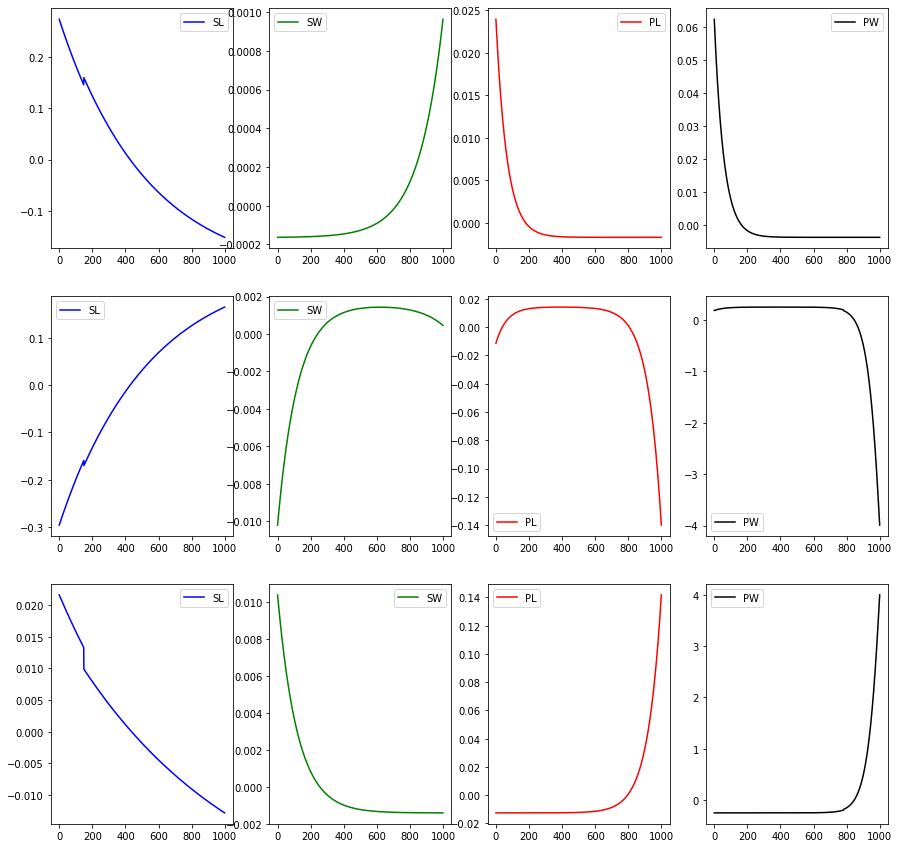

In [59]:
snr_list_len = len(snr_list) # same as ace_with_noise
snr_vals_len = len(snr_list[0])
ace_per_snr_len = len(ace_with_noise[0])
ace_vals_len = len(ace_with_noise[0][0])

colors = ["blue", "green", "red", "black"]
labels = ["SL", "SW", "PL", "PW"]
print(ace_per_snr_len, ace_vals_len, snr_list_len, snr_vals_len)

fig, a = plt.subplots(3, 4)
fig.set_figheight(15)
fig.set_figwidth(15)

for l in range(0, ace_per_snr_len):# for every class and features
    row = int( l / snr_vals_len )
    col = int( l % snr_vals_len )
    #plt.figure( int( l / snr_vals_len ) + 1 )
    
    a[row][col].plot( ace_with_noise[0][l],\
                     color=colors[ int( l % snr_vals_len ) ],\
                     label=labels[ int( l % snr_vals_len ) ] )
    a[row][col].legend()

In [82]:
plt.subplots??

In [64]:
print( snr_list )

[[3.728232687853328, 1.0, 1.0, 1.0], [1.0, 13.697170620746078, 1.0, 1.0], [1.0, 1.0, 7.5081195929670015, 1.0], [1.0, 1.0, 1.0, 64.11287300414061], [6.670936217522158, 18.404353656278946, 10.949563895601647, 71.44100066245603]]


### Predict Model's Accuracy

In [ ]:
X_ohe.shape, y_ohe.shape

In [34]:
y_values_torch = autograd.Variable( torch.Tensor( y_values ).long() )

In [35]:
accuracy_score(y_values_torch.data, y_values_pred.data)

0.9731543624161074

In [37]:
print("Accuracy after perturbing\n")
for i in range(0, X_values.shape[1]):
    if i == X_values.shape[1]:
        i_str = "All"
    else:
        i_str = str(i)
        
    print("feature %s : %f" %\
          (i_str, accuracy_score(y_values_pred.data, y_noise_pred[i].data)))

Accuracy after perturbing

feature 0 : 0.664430
feature 1 : 0.557047
feature 2 : 0.362416
feature 3 : 0.342282


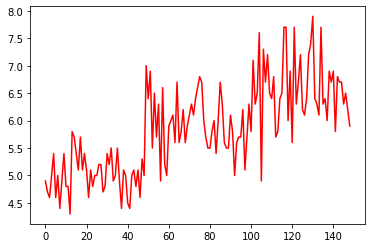

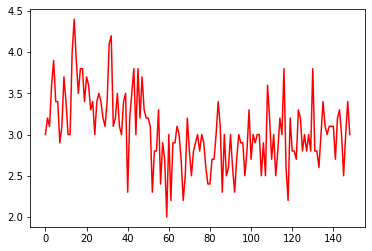

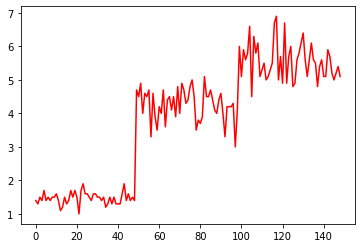

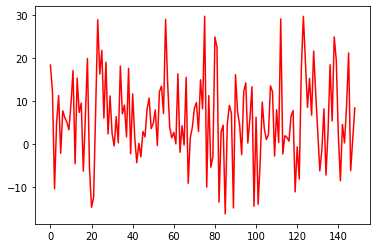

In [40]:
for t in range(0, num_c):
    plt.figure(t+1)
#     plt.plot(X_values[:,t], color="blue")
    plt.plot(X_with_noise[:,t], color="red")

###### Clearly, noise in feature 2 and 3 reduces the model's performance drastically

In [54]:
a = np.ones(shape=(4,3))
a

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [66]:
b = np.copy(a + np.ones(shape=(4,1)))
b = np.reshape(b, newshape=(12,1))
b.shape

(12, 1)

### TSNE

In [28]:
from sklearn.manifold import TSNE
import seaborn as sns

In [31]:
tsneEstimator_ = np.array([[ 10.887485  ,  -1.2263944 ],
        [  6.725139  ,  -6.7579737 ],
        [  8.0404415 ,  -6.557809  ],
        [  9.60826   ,  -5.6433578 ],
        [ 11.5465975 ,  -4.063586  ],
        [  6.1140676 ,  -5.2926297 ],
        [  6.8367705 ,  -7.1800756 ],
        [ 10.935561  ,  -5.136585  ],
        [-24.404613  ,   6.803228  ],
        [  4.5474916 ,  -7.5160966 ],
        [-22.838718  ,   8.439856  ],
        [-21.023151  ,   7.6697946 ],
        [  7.2986445 ,  -6.7662034 ],
        [-17.939447  ,   8.425051  ],
        [  6.5973096 ,  -6.22705   ],
        [-23.51554   ,   6.6964154 ],
        [ 10.713024  ,  -5.9752083 ],
        [-23.741743  ,   7.153346  ],
        [  6.910761  ,  -7.763818  ],
        [-19.988064  ,   7.05581   ],
        [ 14.945258  ,   0.6424049 ],
        [ 13.876123  ,   0.3940313 ],
        [-18.721748  ,   8.922574  ],
        [ 16.846342  ,   0.98580056],
        [ 14.22555   ,  -0.29159176],
        [-20.56352   ,   6.9397964 ],
        [ 12.95162   ,  -4.9957805 ],
        [-22.363605  ,   7.1698523 ],
        [ 10.007576  ,  -5.6584578 ],
        [ 12.308391  ,  -1.6107047 ],
        [ 12.606587  ,  -0.30326885],
        [  7.767901  ,  -6.949802  ],
        [-20.972975  ,   6.177889  ],
        [ 12.872805  ,  -1.633788  ],
        [-23.41415   ,   7.620927  ],
        [-25.681053  ,   6.7022214 ],
        [ 13.491742  ,  -2.2432523 ],
        [ 17.05624   ,  -0.8065212 ],
        [-18.840464  ,   7.540905  ],
        [ 10.8387375 ,   0.12353893],
        [ 14.706105  ,   1.4343275 ],
        [ 11.370485  ,  -3.2021103 ],
        [ 11.9978285 ,  -5.8510604 ],
        [-19.80203   ,   8.514034  ],
        [-19.013403  ,   8.295452  ],
        [-19.810678  ,   8.571537  ],
        [  4.8557096 ,  -7.9474616 ],
        [-21.308601  ,   7.977141  ],
        [-23.51554   ,   6.6964154 ],
        [ 16.74426   ,   1.0493609 ],
        [ 14.560883  ,  -0.20388077],
        [  7.658732  ,  -3.5291789 ],
        [ 10.867557  ,  -2.1204417 ],
        [ 12.45984   ,  -5.0777555 ],
        [ 10.029754  ,  -1.4964472 ],
        [ 16.7411    ,  -0.93189716],
        [  8.360943  ,  -7.3178997 ],
        [-24.346226  ,   6.8324156 ],
        [ 12.746961  ,   0.05275701],
        [  8.258991  ,  -6.964015  ],
        [-24.974466  ,   7.9506454 ],
        [-24.18394   ,   7.571366  ],
        [  5.139072  ,  -8.096402  ],
        [  9.73643   ,  -1.0742939 ],
        [ 13.518272  ,   0.29904678],
        [-21.865816  ,   7.572023  ],
        [ 11.31579   ,  -2.5995162 ],
        [ 13.578205  ,  -0.7098728 ],
        [  9.154429  ,  -7.1597786 ],
        [ 11.931636  ,  -4.2112746 ],
        [  6.222615  ,  -7.9072366 ],
        [ 15.59087   ,  -1.2382753 ],
        [-23.747055  ,   7.950591  ],
        [  9.806005  ,  -5.413179  ],
        [ 11.671076  ,  -5.5973783 ],
        [  9.846151  ,  -1.1658384 ],
        [  4.829093  ,  -7.796213  ],
        [ 14.235912  ,   1.8332312 ],
        [ 10.994731  ,  -1.7885815 ],
        [-22.37475   ,   7.933796  ],
        [-22.819527  ,   6.784199  ],
        [-18.290096  ,   8.544672  ],
        [ 14.634795  ,   0.33068052],
        [-21.590134  ,   7.4011674 ],
        [  9.0389    ,  -7.5614986 ],
        [ 11.77298   ,  -1.2406799 ],
        [ 10.950263  ,  -2.5779707 ],
        [-21.247663  ,   7.2520833 ],
        [-22.398561  ,   7.987477  ],
        [  7.4878154 ,  -3.7136242 ],
        [-19.57386   ,   7.63823   ],
        [ 14.873569  ,   0.81009537],
        [ 13.658904  ,   1.6856785 ],
        [ 16.562738  ,  -0.59035075],
        [ 10.066026  ,  -4.0590787 ],
        [  8.397821  ,  -7.4375987 ],
        [ 14.313403  ,   0.9102798 ],
        [ 15.893254  ,   1.3316892 ],
        [ 12.225802  ,  -5.509209  ],
        [-18.954746  ,   8.167599  ],
        [  9.704034  ,  -3.0522995 ],
        [-24.193148  ,   8.262396  ],
        [  5.5797057 ,  -7.4690614 ],
        [  5.6708007 ,  -6.6879406 ],
        [-20.77534   ,   7.550794  ],
        [ 12.997074  ,  -3.507649  ],
        [-19.701668  ,   8.824119  ],
        [-23.8271    ,   6.1592636 ],
        [ 13.997594  ,   1.7399157 ],
        [ 13.675633  ,   1.0478468 ],
        [ 15.598876  ,  -1.9069179 ],
        [ 12.9552965 ,  -5.3793874 ],
        [-21.967127  ,   9.027935  ],
        [  8.720892  ,  -6.2118692 ],
        [-20.921839  ,   8.310505  ],
        [ 10.02684   ,  -1.4924531 ],
        [-20.562147  ,   6.674361  ],
        [ 13.156892  ,  -0.8011944 ],
        [ 16.063656  ,  -1.3431509 ],
        [-19.812042  ,   7.825981  ],
        [ 12.883431  ,  -1.598128  ],
        [-18.296246  ,   7.8505893 ],
        [  6.255401  ,  -6.7588587 ],
        [-23.51554   ,   6.6964154 ],
        [  7.2023153 ,  -7.323541  ],
        [  9.422406  ,  -6.543001  ],
        [-24.152283  ,   6.470398  ],
        [-23.528852  ,   7.69359   ],
        [ 11.414181  ,  -5.8251424 ],
        [-21.562836  ,   6.2702737 ],
        [  5.2314916 ,  -6.3281584 ],
        [  7.773138  ,  -7.7673273 ],
        [-25.061068  ,   7.324469  ],
        [  7.37764   ,  -4.040635  ],
        [  9.90815   ,  -6.0780063 ],
        [  6.137664  ,  -7.3183002 ],
        [ 11.846432  ,  -4.81511   ],
        [ 15.390342  ,  -0.39732736],
        [-20.204983  ,   8.2900505 ],
        [-21.574057  ,   6.86118   ],
        [ 16.538881  ,  -0.26025024],
        [  8.674148  ,  -3.5604236 ],
        [ 16.20655   ,  -1.205052  ],
        [  5.6860995 ,  -7.243129  ],
        [  9.128132  ,  -3.472589  ],
        [ 11.057795  ,  -2.7403803 ],
        [  9.053131  ,  -5.6457987 ],
        [ 14.395664  ,   0.39181983],
        [-24.783665  ,   7.6814947 ]])

tsneEstimator_.shape

(149, 2)

In [32]:
tsne = TSNE(init=tsneEstimator_, n_components=2)
X_embedded = tsne.fit_transform(X_values)
X_embedded.shape

(149, 2)

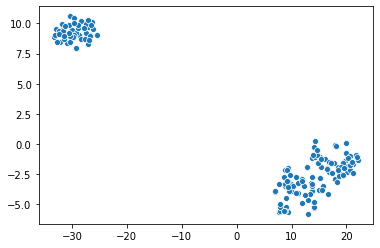

In [33]:
sns.scatterplot(X_embedded[:,0], X_embedded[:,1])
plt.savefig("../../Data/Iris/tsne_original_data_v2" + ".png")

In [34]:
tsne.get_params(), tsne.embedding_, tsne.kl_divergence_, tsne.n_iter_

({'angle': 0.5,
  'early_exaggeration': 12.0,
  'init': array([[ 10.887485  ,  -1.2263944 ],
         [  6.725139  ,  -6.7579737 ],
         [  8.0404415 ,  -6.557809  ],
         [  9.60826   ,  -5.6433578 ],
         [ 11.5465975 ,  -4.063586  ],
         [  6.1140676 ,  -5.2926297 ],
         [  6.8367705 ,  -7.1800756 ],
         [ 10.935561  ,  -5.136585  ],
         [-24.404613  ,   6.803228  ],
         [  4.5474916 ,  -7.5160966 ],
         [-22.838718  ,   8.439856  ],
         [-21.023151  ,   7.6697946 ],
         [  7.2986445 ,  -6.7662034 ],
         [-17.939447  ,   8.425051  ],
         [  6.5973096 ,  -6.22705   ],
         [-23.51554   ,   6.6964154 ],
         [ 10.713024  ,  -5.9752083 ],
         [-23.741743  ,   7.153346  ],
         [  6.910761  ,  -7.763818  ],
         [-19.988064  ,   7.05581   ],
         [ 14.945258  ,   0.6424049 ],
         [ 13.876123  ,   0.3940313 ],
         [-18.721748  ,   8.922574  ],
         [ 16.846342  ,   0.98580056],
         [

In [36]:
tsne_embedding_ = np.copy(tsne.embedding_)

In [37]:
tsneParams = {'angle': 0.5,
 'early_exaggeration': 12.0,
 'init': 'random',
 'learning_rate': 200.0,
 'method': 'barnes_hut',
 'metric': 'euclidean',
 'min_grad_norm': 1e-07,
 'n_components': 2,
 'n_iter': 1000,
 'n_iter_without_progress': 300,
 'perplexity': 30.0,
 'random_state': None,
 'verbose': 0}

In [38]:
X_gauss_noise = getGaussNoise(seed=10, loc=5, scale=10, size=X_values.shape[0])
X_gauss_noise.shape

(149,)

In [39]:
X_values.shape

(149, 4)

In [40]:
def plot(npA, npB):
    plots = npA.shape[1]
    for i in range(0, plots):
        plt.figure(i+1)
        plt.plot(npA[:,i], color='blue', label='new')
        plt.plot(npB[:,i], color='green', label='original')
        plt.legend()
    #end-for
#end-plot

In [41]:
fp = ["0th", "1st", "2nd", "3rd"]
for i in range(0, X_values.shape[1]):
# i = 0
    new_X = np.copy(X_values)
    new_X[:,i] = np.copy(X_values[:,i] + X_gauss_noise)
    
    #plot(new_X, X_values)
    
    scaler = MinMaxScaler()
    new_X = scaler.fit_transform(new_X)
    
    new_tsne = TSNE(init=tsneEstimator_)
    new_X_embedded = new_tsne.fit_transform(new_X)
    new_X_embedded.shape
    
    print("%dth feature perturbed" % (i))
#     sns.scatterplot(new_X_embedded[:,0], new_X_embedded[:,1])
    plt.scatter(new_X_embedded[:,0], new_X_embedded[:,1], color="blue", label="perturbed")
    plt.scatter(X_embedded[:,0], X_embedded[:,1], color="red", label="original")
    plt.legend()

    plt.savefig("../../Data/Iris/tsne_perturbed_feature_" + fp[i] + "_v2.png")
    '''
    if(i == 0):
        plt.savefig("../../Data/Iris/tsne_perturbed_feature_0th" + ".png")
    elif (i == 1):
        plt.savefig("../../Data/Iris/tsne_perturbed_feature_1st" + ".png")
    elif(i == 2):
        plt.savefig("../../Data/Iris/tsne_perturbed_feature_2nd" + ".png")
    elif(i == 3):
        plt.savefig("../../Data/Iris/tsne_perturbed_feature_3rd" + ".png")
    '''
    plt.clf()
    plt.close()

0th feature perturbed
1th feature perturbed
2th feature perturbed
3th feature perturbed


In [82]:
np.random.normal??

In [70]:
tsne.get_params()

{'angle': 0.5,
 'early_exaggeration': 12.0,
 'init': 'random',
 'learning_rate': 200.0,
 'method': 'barnes_hut',
 'metric': 'euclidean',
 'min_grad_norm': 1e-07,
 'n_components': 2,
 'n_iter': 1000,
 'n_iter_without_progress': 300,
 'perplexity': 30.0,
 'random_state': None,
 'verbose': 0}

In [23]:
snrList = []
kl_d_list = []
deltaMeanList = []
deltaCovList = []

def featureInvestigation(noiseFunc):
    X_noise = np.zeros(shape=X_values.shape)
    X_full = np.zeros(shape=(2*X_values.shape[0], X_values.shape[1]))
    
    for mu in [100, 500]: # TODO : simulate for mu = 0 and 0.5 and std_dev 0 - 10
        for sigma in [mu/4, mu/2]:
            
            X_noise = np.copy(X_values)
            for t in range(0, num_c): # add noise in all features
                X_noise[:,t] = X_values[:,t] + noiseFunc(10*t, mu, sigma, X_values.shape[0])
            
                # Investigate after perturbation on each feature
                X_full = np.append(X_values, X_noise, axis=0) # append row wise
#                 print("X_full : ", X_full.shape)

                plt.figure(mu+sigma+t+1)
                plt.plot(X_noise)
        
                plt.figure(mu+sigma+t+2)
                plt.plot(X_values)
                
                plt.figure(mu+sigma+t+3)
                plt.plot(X_full)

                # ACE computation
                cov = np.cov( X_full, rowvar=False )
                means = np.mean( X_full, axis=0 )
                deltaMeanList.append( means )
                deltaCovList.append( cov )
                getACE(meanVector=means, covMatrix=cov, n_classes=3, num_c=4, num_alpha=1000, feature=t,\
                          noise_mean=mu, noise_std_dev=sigma, dataCategory="orig+perturb")
            
                # Compute SNR for all the features
                snrList.append( snr( X_values, X_noise, verbose=False ) )
            
                # Distance between distribution
                pdf_Q = normToPDF(X_values)
                pdf_P = normToPDF(X_noise)
                kl_d_list.append( kl_divergence( pdf_P, pdf_Q, verbose=False ) )
                
    return X_noise, X_full

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained 

TypeError: append() takes exactly one argument (4 given)

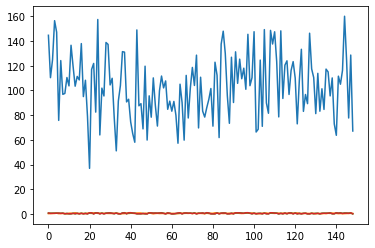

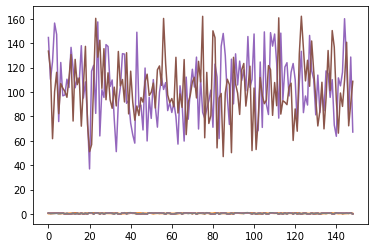

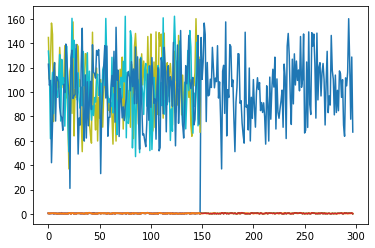

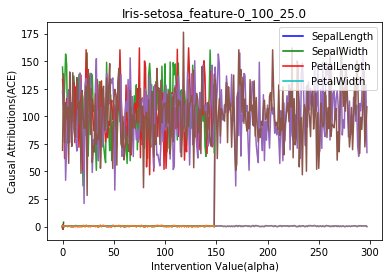

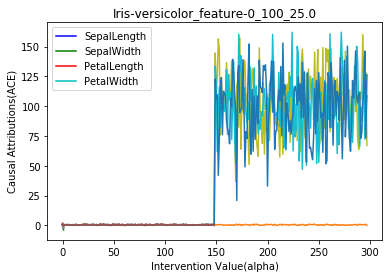

...

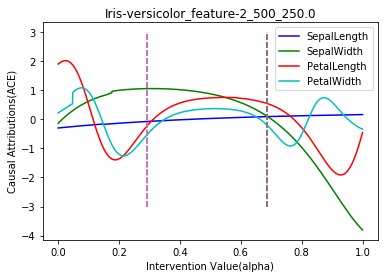

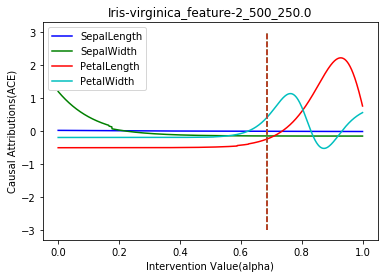

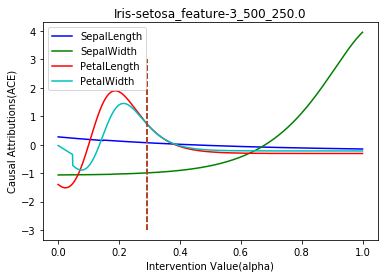

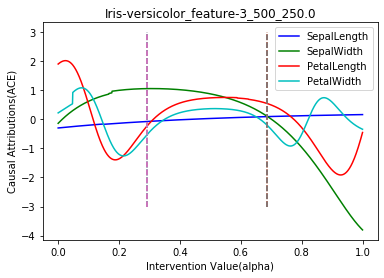

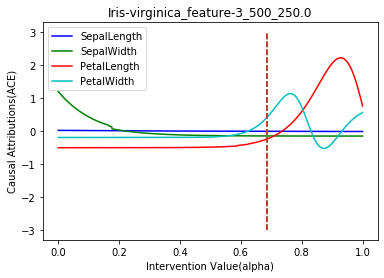

In [42]:
gaussNoiseResults = []
xn, xf = featureInvestigation(noiseFunc=getGaussNoise)
gaussNoiseResults.append(snrList, kl_d_list, deltaMeanList, deltaCovList)

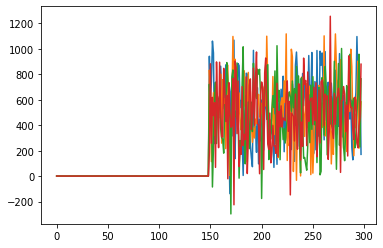

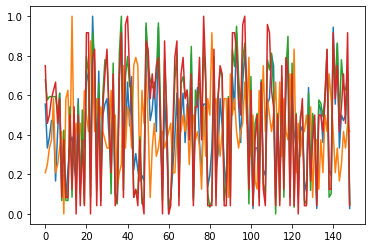

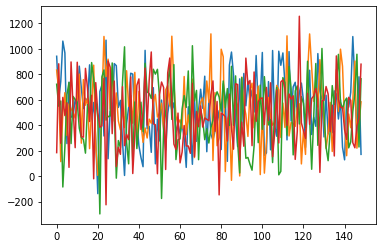

In [39]:
plt.figure(1)
plt.plot(xf)

plt.figure(2)
plt.plot(X_values)

plt.figure(3)
plt.plot(xn)

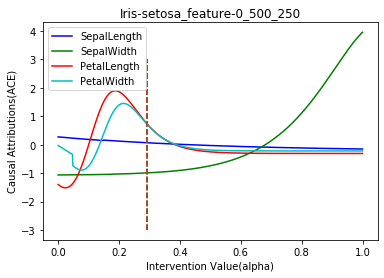

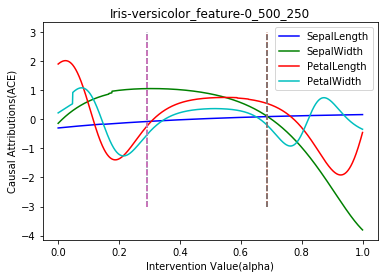

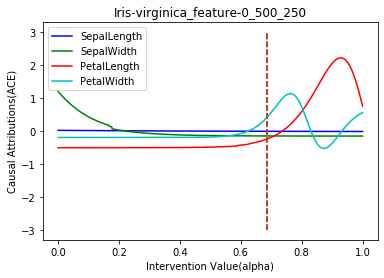

In [40]:
getACE(meanVector=np.mean(xn,axis=0), covMatrix=np.cov(xn, rowvar=False), n_classes=3,\
       num_c=4, num_alpha=1000, feature=0, noise_mean=500, noise_std_dev=250, dataCategory="orig+perturb")

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained 

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained 

TypeError: append() takes exactly one argument (4 given)

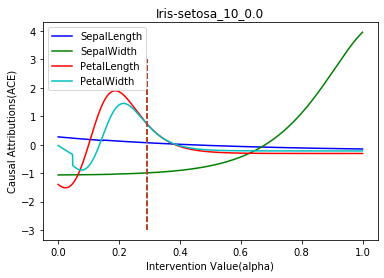

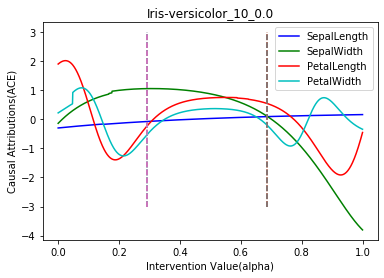

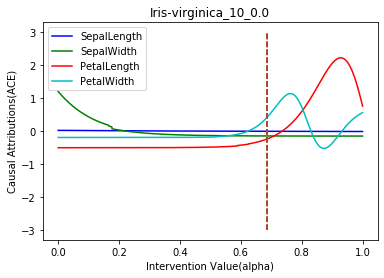

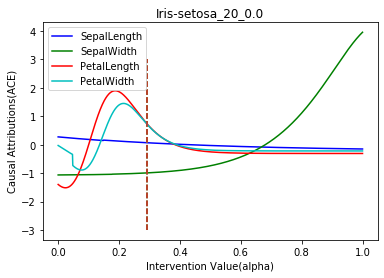

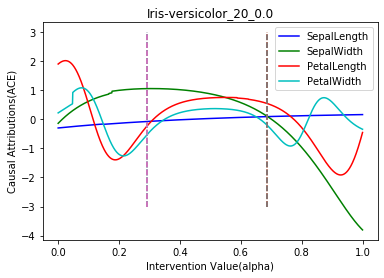

...

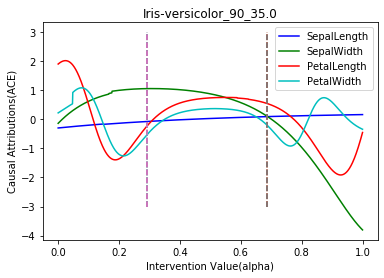

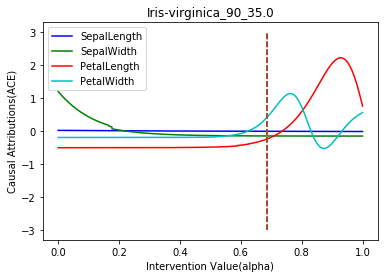

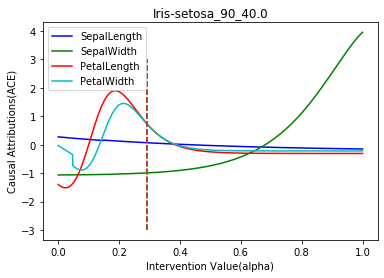

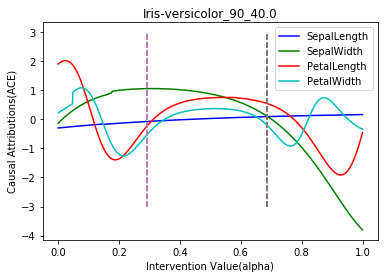

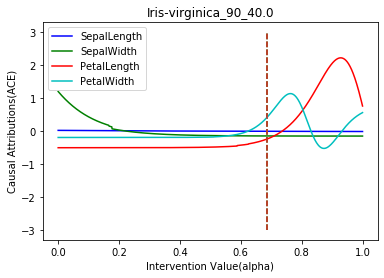

In [88]:
laplaceNoiseResults = []
featureInvestigation(noiseFunc=getLaplaceNoise)
laplaceNoiseResults.append(snrList, kl_d_list, deltaMeanList, deltaCovList)

In [18]:
X_perturb_feature = np.zeros(shape=np.append(num_c, X_values.shape))
y_perturb_feature = np.zeros(shape=np.append(num_c, y_values.shape))

# (a,b,c) - a : perturbed feature index, b : #rows, c : #features
print("X_perturb_feature : ", X_perturb_feature.shape)
print("y_perturb_feature : ", y_perturb_feature.shape)

for t in range(0, num_c):
    X_perturb_feature[t,:,:] = X_values #populate the matrix with original data
    X_perturb_feature[t,:,t] = X_values[:,t] + getGaussNoise(seed=10*t, \
                                                             loc=0.0,\
                                                             scale=0.5,\
                                                             size=X_values.shape[0])

X_perturb_feature :  (4, 149, 4)
y_perturb_feature :  (4, 149, 3)


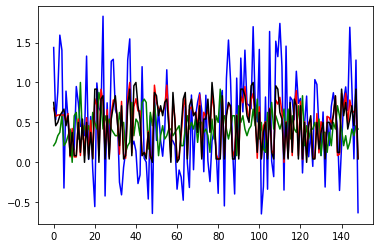

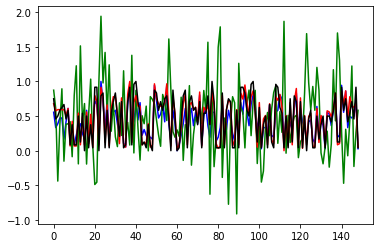

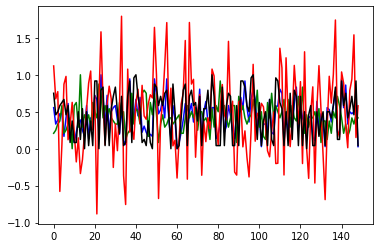

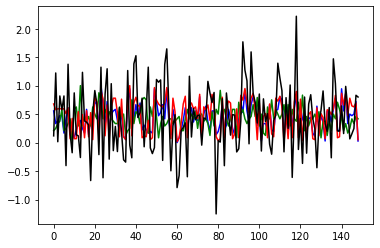

In [19]:
for t in range(0, num_c):
    plt.figure(t+1)
    plt.plot(X_perturb_feature[t,:,0], color="blue")
    plt.plot(X_perturb_feature[t,:,1], color="green")
    plt.plot(X_perturb_feature[t,:,2], color="red")
    plt.plot(X_perturb_feature[t,:,3], color="black")

### Original distribution

In [22]:
cov_orig = np.cov(X_values, rowvar=False)
mean_orig = np.mean(X_values, axis=0)

print("Original distribution : \n")
print("Mean vector : ", mean_orig, "\n")
print("Covariance Matrix : ", cov_orig, "\n")

Original distribution : 

Mean vector :  [0.4300895  0.43791953 0.47025377 0.46057057] 

Covariance Matrix :  [[ 0.05297593 -0.00431466  0.0598099   0.05964663]
 [-0.00431466  0.03262522 -0.022368   -0.02009525]
 [ 0.0598099  -0.022368    0.08895066  0.09103985]
 [ 0.05964663 -0.02009525  0.09103985  0.10061901]] 



### Introspect distribution of features

In [43]:
from statsmodels.graphics.gofplots import qqplot

In [24]:
X_prob = np.zeros(shape=X_values.shape)

for t in range(0, num_c):
    X_prob[:,t] = X_values[:,t] / X_values[:,t].sum()

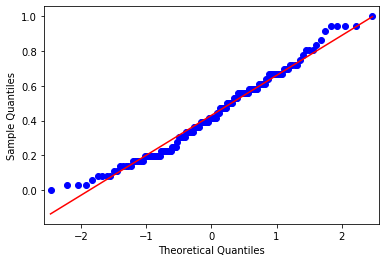

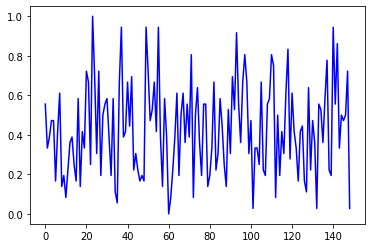

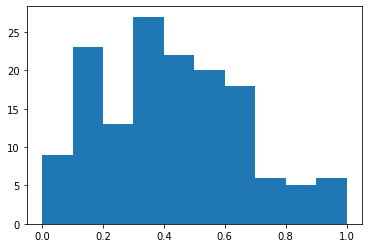

<Figure size 432x288 with 0 Axes>

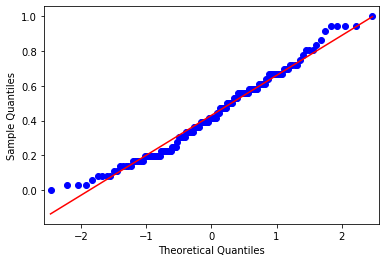

In [27]:
t = 0
plt.figure(1)
plt.plot(X_values[:,t], color=color[t])

plt.figure(2)
plt.hist(X_values[:,t])

plt.figure(3)
qqplot(X_values[:,t], line='s')

###### Reference : Normality test via visualization https://medium.com/@rrfd/testing-for-normality-applications-with-python-6bf06ed646a9

<Figure size 432x288 with 0 Axes>

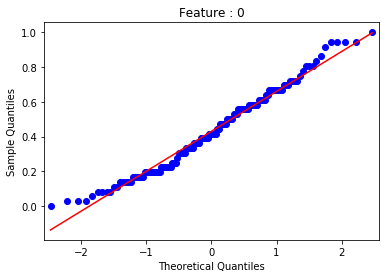

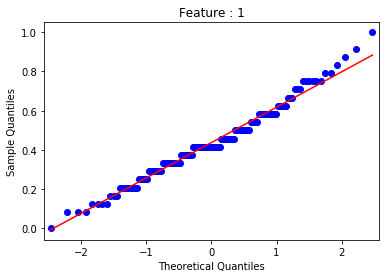

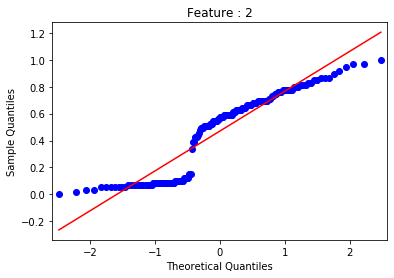

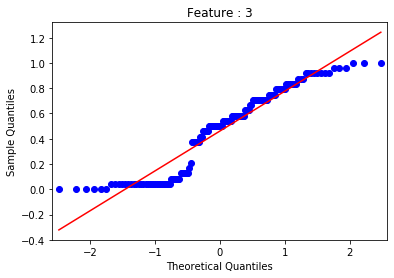

In [44]:
for t in range(0, num_c):
    plt.figure(t+1)
    qqplot(X_values[:,t], line='s')
    plt.title("Feature : " + str(t))

### Shapiro-Wilk Test
###### Reference : https://machinelearningmastery.com/a-gentle-introduction-to-normality-tests-in-python/

In [28]:
from scipy.stats import shapiro

t = 0 #feature index

# Normality test
alpha = 0.05
for t in range(0, num_c):
    stat, p = shapiro(X_values[:,t])
    #print(stat, p)
    if p > alpha:
        print("Feature[%d] is from gaussian distribution" % (t))
    else:
        print("Feature[%d] is not from gaussian distribution" % (t))

Feature[0] is not from gaussian distribution
Feature[1] is from gaussian distribution
Feature[2] is not from gaussian distribution
Feature[3] is not from gaussian distribution


### D’Agostino’s K^2 Test
###### Reference : https://machinelearningmastery.com/a-gentle-introduction-to-normality-tests-in-python/

In [29]:
from scipy.stats import normaltest

t = 0
alpha = 0.05

for t in range(0, num_c):
    stat, p = normaltest(X_values[:,t])
    print('Statistics=%.3f, p=%.3f' % (stat, p))

    if p > alpha:
        print("Feature[%d] is from gaussian distribution" % (t))
    else:
        print("Feature[%d] is not from gaussian distribution" % (t))

Statistics=5.541, p=0.063
Feature[0] is from gaussian distribution
Statistics=3.924, p=0.141
Feature[1] is from gaussian distribution
Statistics=189.937, p=0.000
Feature[2] is not from gaussian distribution
Statistics=125.114, p=0.000
Feature[3] is not from gaussian distribution


### Anderson-Darling Test
###### Reference : https://machinelearningmastery.com/a-gentle-introduction-to-normality-tests-in-python/¶

In [30]:
from scipy.stats import anderson

t = 0
for t in range(0, num_c):
    result = anderson(X_values[:,t])
    print('Statistics=.3%f' % (result.statistic))
    
    p = 0
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < cv:
            print("Feature[%d] is from gaussian distribution with .3%f, .3%f" % (t, sl, cv))
        else:
            print("Feature[%d] is not from gaussian distribution with .3%f, .3%f" % (t, sl, cv))

Statistics=.30.837899
Feature[0] is not from gaussian distribution with .315.000000, .30.562000
Feature[0] is not from gaussian distribution with .310.000000, .30.640000
Feature[0] is not from gaussian distribution with .35.000000, .30.767000
Feature[0] is from gaussian distribution with .32.500000, .30.895000
Feature[0] is from gaussian distribution with .31.000000, .31.065000
Statistics=.31.014651
Feature[1] is not from gaussian distribution with .315.000000, .30.562000
Feature[1] is not from gaussian distribution with .310.000000, .30.640000
Feature[1] is not from gaussian distribution with .35.000000, .30.767000
Feature[1] is not from gaussian distribution with .32.500000, .30.895000
Feature[1] is from gaussian distribution with .31.000000, .31.065000
Statistics=.37.550600
Feature[2] is not from gaussian distribution with .315.000000, .30.562000
Feature[2] is not from gaussian distribution with .310.000000, .30.640000
Feature[2] is not from gaussian distribution with .35.000000, .3

### ACE on original + perturb features under same label

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


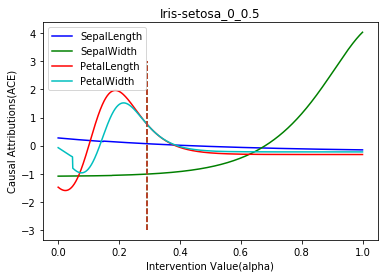

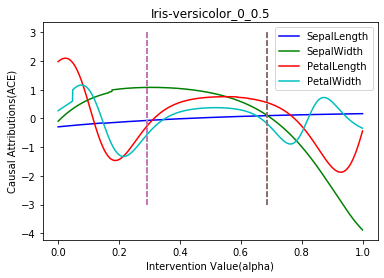

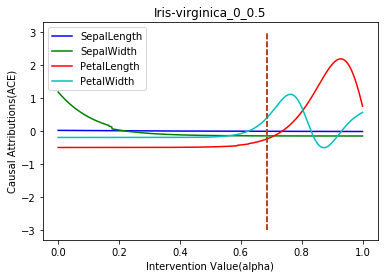

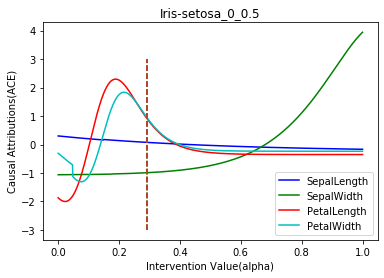

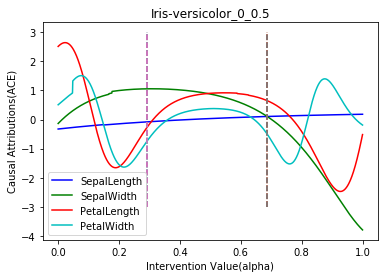

...

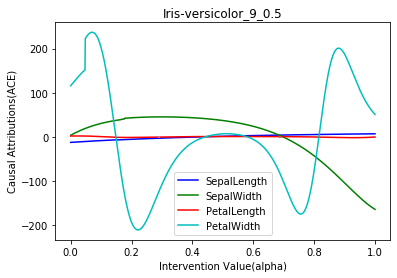

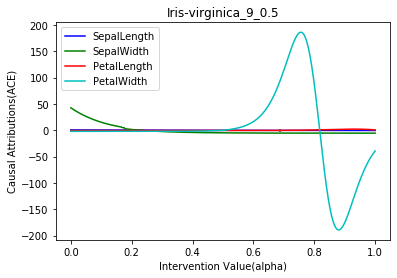

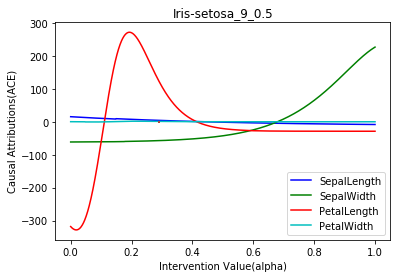

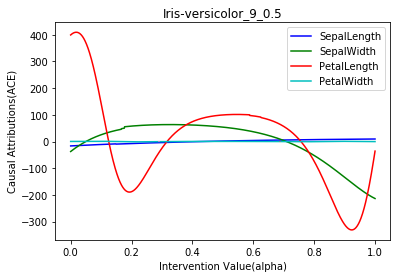

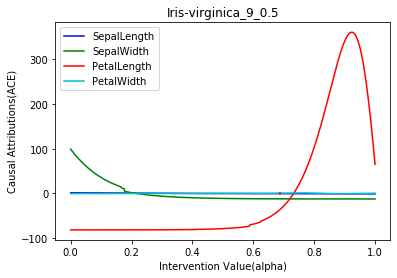

In [32]:
# append perturb feature dataset with original data
X_full = np.zeros(shape=np.append(X_perturb_feature.shape[0],\
                                 np.append(X_perturb_feature.shape[1] + X_values.shape[0],\
                                          X_values.shape[1]
                                          )
                                 )
                 )

deltaMeanList = []
deltaCovList = []
std_dev = 0.5
for mu in np.arange(0, 10, 1): # Loop over all mean values
    for t in range(0, num_c): # Perturb one feature under a particular perturbed index 
        X_perturb_feature[t,:,:] = X_values #populate the matrix with original data
        X_perturb_feature[t,:,t] = X_values[:,t] + getGaussNoise(seed=10*t, \
                                                                 loc=mu,\
                                                                 scale=std_dev,\
                                                                 size=X_values.shape[0])

    for t in range(0, num_c): # Join 1 perturbed feature data with original data and compute ACE
        X_full[t,:,:] = np.append(X_perturb_feature[t,:,:], X_values, axis=0) # append row-wise
        
        # compute mean and covariance and evaluate ACE for each perturbed feature along with original dataset
        cov = np.cov(X_full[t,:,:], rowvar=False)
        means = np.mean(X_full[t,:,:], axis=0)
    
        deltaMeanList.append( means )
        deltaCovList.append( cov )
    
        getACE(meanVector=means, covMatrix=cov, n_classes=3, num_c=4, num_alpha=1000, feature=t,\
              noise_mean=mu, noise_std_dev=std_dev, dataCategory="orig+perturb")

In [25]:
print(deltaMeanList, "\n")
print(deltaCovList, "\n")

[array([0.46242022, 0.43791946, 0.47025368, 0.46057045]), array([0.43008947, 0.4583298 , 0.47025368, 0.46057045]), array([0.43008947, 0.43791946, 0.46708403, 0.46057045]), array([0.43008947, 0.43791946, 0.47025368, 0.44866766])] 

[array([[ 0.20758385, -0.00757994,  0.0754567 ,  0.07412525],
       [-0.00757994,  0.03251537, -0.02229269, -0.02002759],
       [ 0.0754567 , -0.02229269,  0.08865116,  0.09073332],
       [ 0.07412525, -0.02002759,  0.09073332,  0.10028023]]), array([[ 0.05279756, -0.0104157 ,  0.05960852,  0.0594458 ],
       [-0.0104157 ,  0.16576343, -0.03239403, -0.03251586],
       [ 0.05960852, -0.03239403,  0.08865116,  0.09073332],
       [ 0.0594458 , -0.03251586,  0.09073332,  0.10028023]]), array([[ 0.05279756, -0.00430014,  0.05292894,  0.0594458 ],
       [-0.00430014,  0.03251537, -0.01257709, -0.02002759],
       [ 0.05292894, -0.01257709,  0.19753413,  0.07078459],
       [ 0.0594458 , -0.02002759,  0.07078459,  0.10028023]]), array([[ 0.05279756, -0.004300

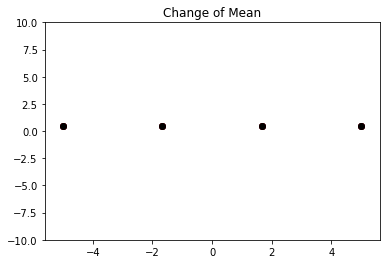

In [26]:
color=["blue", "green", "red", "black"]
l = len(deltaMeanList)

for i in range(0, l):
    plt.scatter(np.linspace(-5,5,deltaMeanList[i].shape[0]),\
               deltaMeanList[i], color=color[i])
    plt.ylim(-10,10)
    plt.title("Change of Mean")

delta cov matrix list length :  4


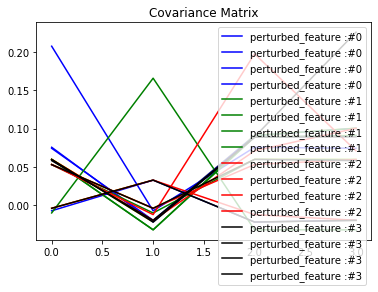

In [27]:
l = len(deltaCovList)
print("delta cov matrix list length : ", l)
plt.plot(cov_orig, color="yellow")

for i in range(0,l):
    plt.plot(deltaCovList[i], color=color[i], label="perturbed_feature :#"+str(i))
    plt.title("Covariance Matrix")
    plt.legend()

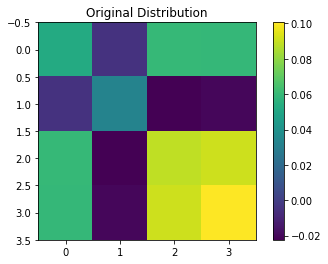

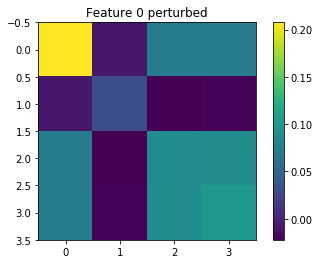

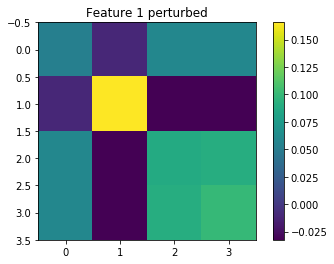

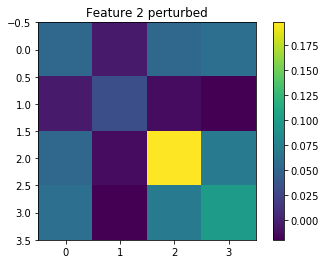

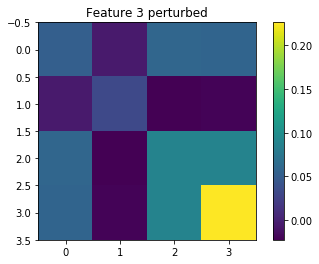

In [30]:
plt.figure(1)
plt.imshow(cov_orig)
plt.title("Original Distribution")
plt.colorbar()

for t in range(0, num_c):
    plt.figure(t+2)
    plt.imshow(deltaCovList[t])
    plt.title("Feature %d perturbed" % (int(t)))
    plt.colorbar()

### AY: Add Gaussian noise to dataset

/anaconda3/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


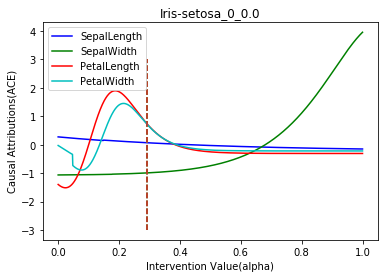

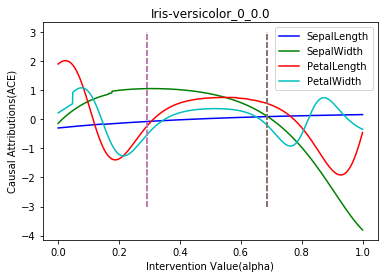

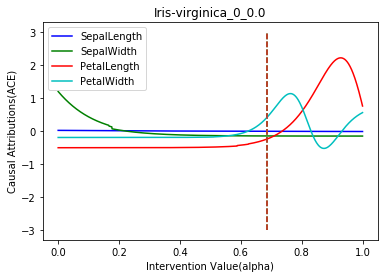

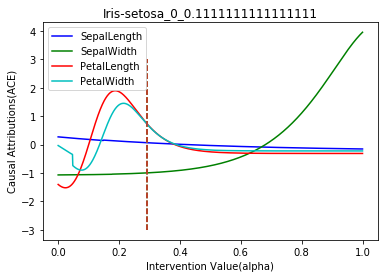

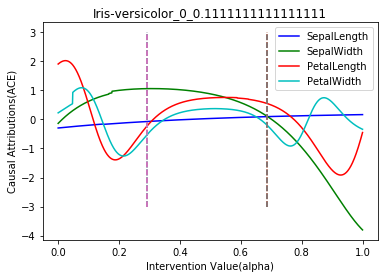

...

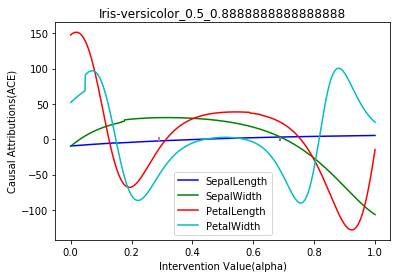

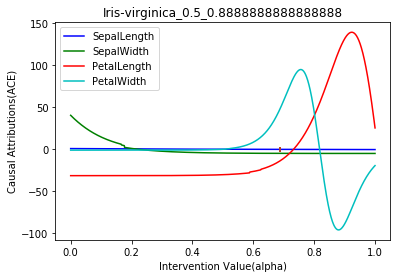

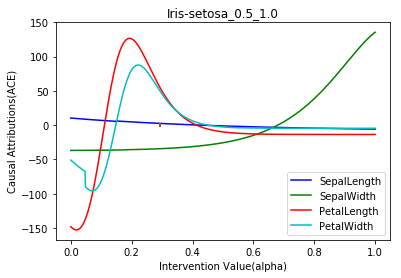

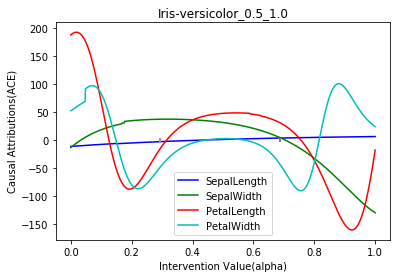

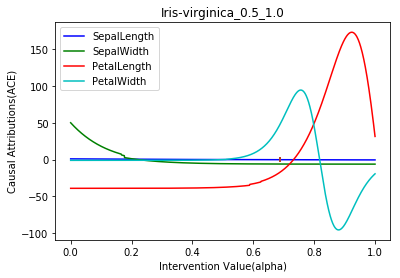

In [24]:
for n_mean in [0, 0.5]:
    for t in range(0,num_c):
        for std_dev in np.linspace(0, 1, 10):
            gaussNoise = np.random.normal(n_mean, std_dev, size=X_values.shape[0])
            #print("Gauss Noise shape : ", gaussNoise.shape, " Dataset shape : ", X_values.shape)

            X_values[:,t] += gaussNoise
    
            cov = np.cov(X_values, rowvar=False)
            means = np.mean(X_values, axis=0)
    
            getACE(meanVector=means, covMatrix=cov, n_classes=3, num_c=4,\
                   num_alpha=1000, feature=t, noise_mean=n_mean, noise_std_dev=std_dev)

In [20]:
#model = torch.load("/gdrive/My Drive/IRIS/Code/iris_double_model_8")
model = torch.load("../../Models/iris_double_model_8")
model

/home/red_beast/Workspace/Anaconda/envs/py36/lib/python3.6/site-packages/torch/serialization.py:453: SourceChangeWarning: source code of class 'torch.nn.modules.linear.Linear' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


neural_network(
  (hidden): Linear(in_features=4, out_features=8, bias=True)
  (out): Linear(in_features=8, out_features=3, bias=True)
)

In [1]:
from google.colab import drive
drive.mount('/gdrive')
%ls /gdrive

ModuleNotFoundError: No module named 'google.colab'